## Hold It Close: Male Octopus Hold Their Hectocotylized Arm Closer to Their Body

*Willem Lee Weertman*

#### **Abstract**

The third to the right arm of male octopus is the hectocotylus. This arm is specialized to hold sperm packet, it is often referred to as the 'penis' of octopus. Male octopus are often described as holding their hectocotylus closer to their body in a protective manner. This observation has never been described quantitatively. In this notebook I show this observation is indeed true, using a dataset I collected for my Masters thesis. This dataset comprises continous video recordings of twelve octopuses, eight male and four female, living in a large aquarium. The dataset was annotated with DeepLabCut, finding the eyes, mantle tip, and arm tips of the octopuses. When the octopus were moving across the middle of the aquarium, far from the walls, was subsetted using the eye coordinates. This subsetted dataset comprised ~12.2 hours of octopus moving across the aquarium.

In this work I use the DeepLabCut arm tip predictions to show that the model 'learned' from training examples that male octopus hold their third to the right arm ('penis') closer to their body. This holding-it-close is different from what is was observed in the females.

![flume.png](../DATA/diagrams/flume.png)
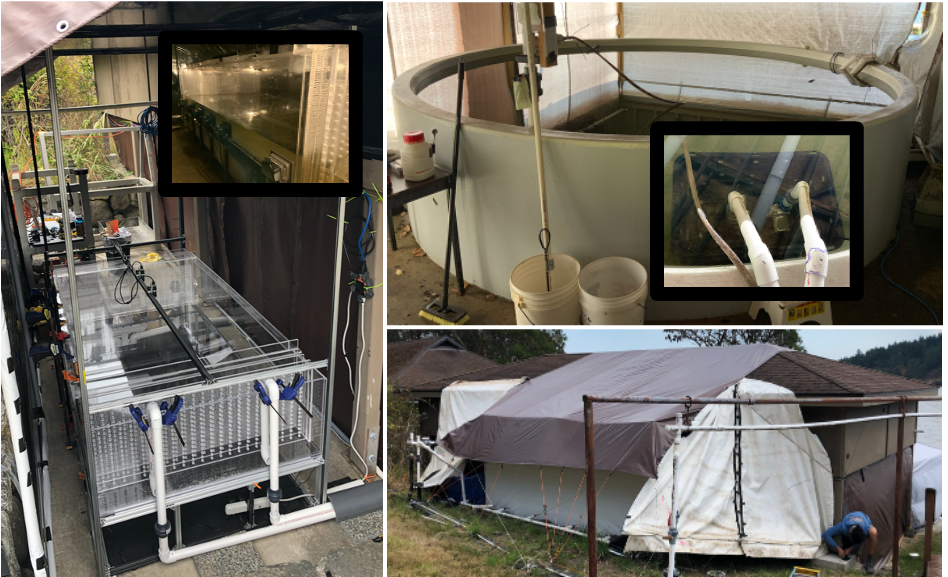

*Figure 1*. Large aquarium which the octopus were moving across. 

![DLC.png](../DATA/diagrams/DLC.png)
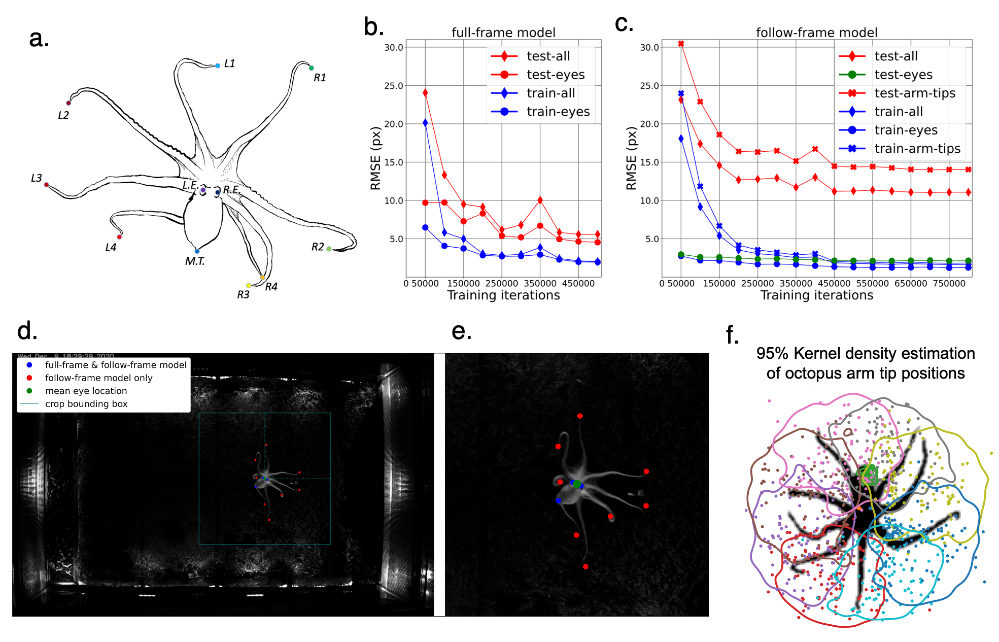

*Figure 2*. Performance of the DeepLabCut models used to track the octopus in the aquarium. (a) The eyes, mantle tip, and arm tips were tracked. A two step tracking tracking process was used. (b, d) First a model took in the 1920x1200 image of the aquarium and found the eyes, and mantle tip. Next (c, e) when the octopus were within the middle of the flume was subset using a user defined rectangle and a 'follow-frame' series of images with the octopuses centered in the was created. A model when then trained to find the eyes, mantle tip, and arm tips. (c, f) Model performance for the eyes and mantle tip was excellent, equivalent to human annotations. For the arm tips the model had more error ~2 cm Root Mean Square Error. For the use of the model in this report, we look at summary statistics of the predicted location of the arm tips for a *large* number of images for each octopus. Think of the results not as exactly what the octopus was doing, but what the model learned is a representation of the octopuses arms. 

![wall_pref_fig.png](../DATA/diagrams/wall_pref_fig.png)
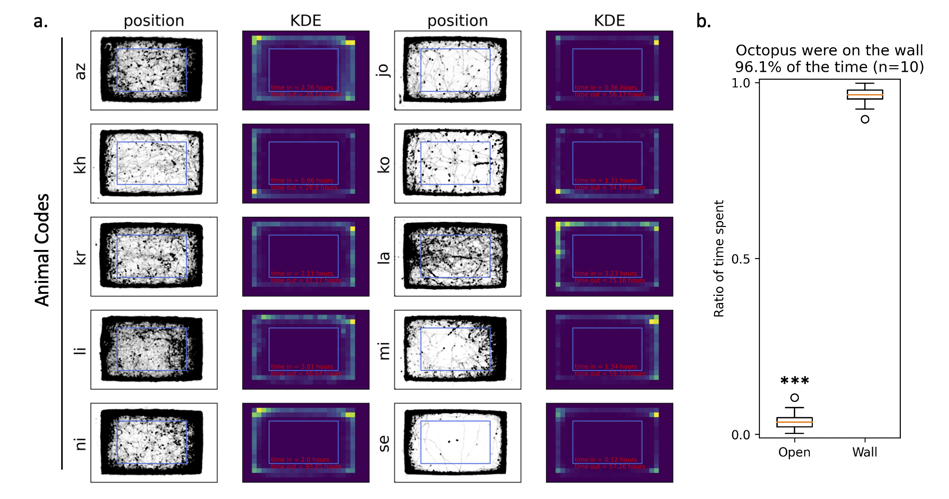

*Figure 3*. (a) positions of where 10 different octopuses in the aquarium where while alert and active in the aquarium. Alert and active was hand scored by two experimenters. The away from the walls box was used to subset when the octopus were in the middle of the aquarium. (b) The octopus spent 96.1% of their time on the wall.

Before we can treat where the octopus arm tips are relative to the octopus first we must translate the octopus data into the frame of reference of the octopus

![std_follow-frame.png](../DATA/diagrams/std_follow-frame.png)
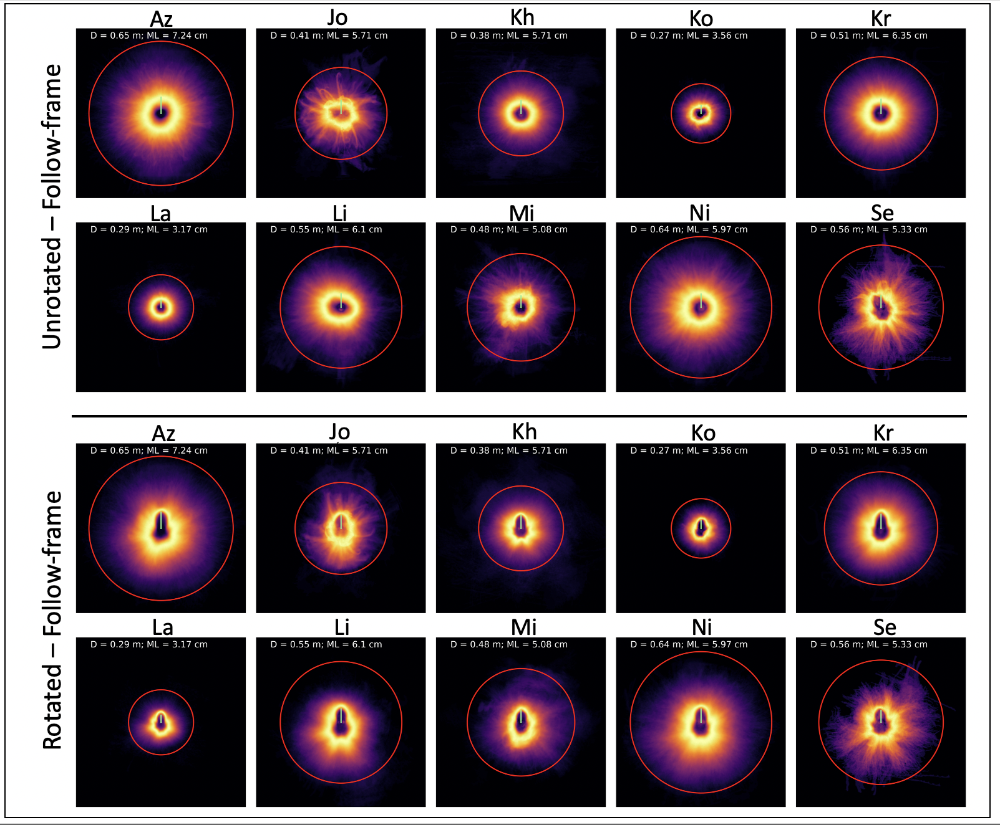

*Figure 4*. Before we can treat where the octopus arm tips are relative to the octopus first we must translate the octopus data into the frame of reference of the octopus. Above shows the standard deviation of the 'follow-frame' videos tracking 10 different octopuses before and after rotation. Note how the you can then see the 'shape' of the octopus.

First lets import the data

In [1]:
import os
import glob

import cv2
import numpy as np
import math
import random
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.cm as cm
import matplotlib as mpl
from matplotlib.lines import Line2D

import seaborn as sns

from scipy import stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multicomp import pairwise_tukeyhsd

from tqdm import tqdm


Then we will read in the data

In [2]:
path_df = '../DATA/dlc_inference/unrotated_tips.csv'

if os.path.exists(path_df) != True:
    print(f'{path_df} does not exist!')
else:
    print(f'opening {path_df}')
    df = pd.read_csv(path_df)
    df

opening ../DATA/dlc_inference/unrotated_tips.csv


In [3]:
fps = 10 # frames/sec
totalTime = df.shape[0]/fps/60/60
print(f'Time recordings = {round(totalTime,3)} hours!')

Time recordings = 12.227 hours!


 we can use the eyes locations of the octopus to find which way they are facing, and then we can use that to rotate the predictions!

![dlc_figure-2.png](../DATA/diagrams/dlc_figure.png)
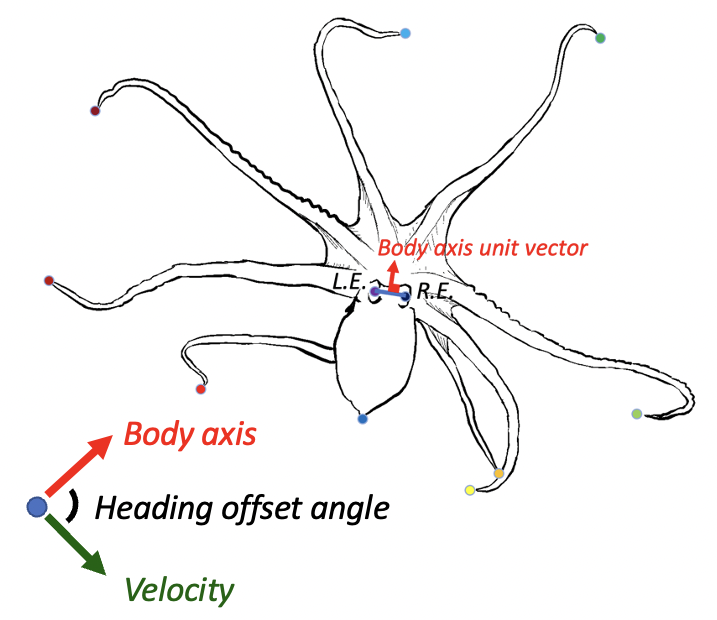

*Figure 5*. The eyes of an octopus are placed above the center of their symmetry. A vector, perpindicular to their mid point can be used to find which way they are facing. 

Defining a function to rotate the arm tips

In [4]:
def rotate(origin, point, angle):
    """
    Rotate a point counterclockwise by a given angle around a given origin.
    The angle should be given in radians.
    """
    ox, oy = origin
    px, py = point
    qx = ox + math.cos(angle) * (px - ox) - math.sin(angle) * (py - oy)
    qy = oy + math.sin(angle) * (px - ox) + math.cos(angle) * (py - oy)
    return qx, qy

First as an example I will rotate the eyes relative to show what the data looks like. before and after rotation

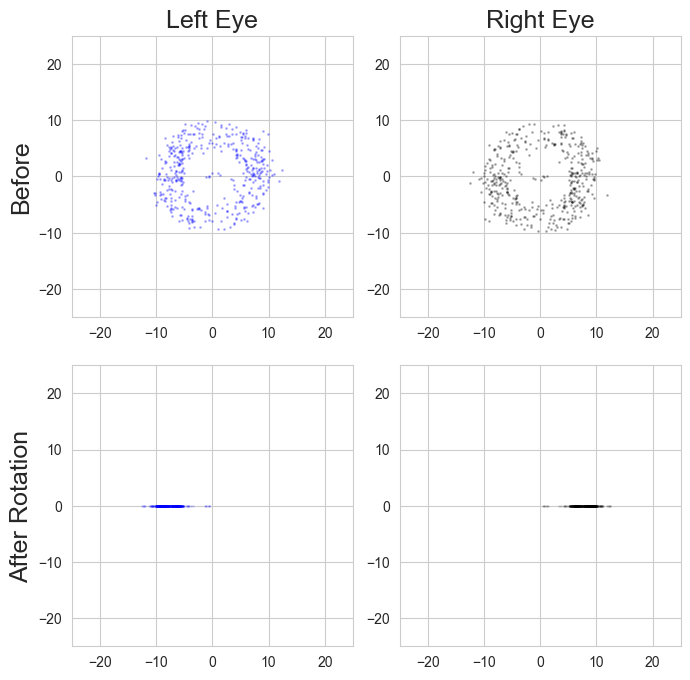

In [5]:
ss = 1000 ## get every 1000th prediction, just to make the example fast!

## right eye ##
rex = np.array(df['righteye_x'].tolist())[::ss]
rey = np.array(df['righteye_y'].tolist())[::ss]

## left eye ##
lex = np.array(df['lefteye_x'].tolist())[::ss]
ley = np.array(df['lefteye_y'].tolist())[::ss]

## mean point between the eyes ##
mex = np.array(df['Meaneye_x'].tolist())[::ss]
mey = np.array(df['Meaneye_y'].tolist())[::ss]

## center the eyes on the mean point ##
rex = rex-mex
rey = rey-mey
lex = lex-mex
ley = ley-mey

## Figure

fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2,figsize=(7,7))

ax=ax1
ax.scatter(lex,ley,s=1,alpha=0.25,color='blue')

ax.set_title('Left Eye', fontsize=18)
ax.set_xlim(-25,25)
ax.set_ylim(-25,25)
ax.set_aspect('equal')
ax.set_ylabel('Before', fontsize=18)

ax=ax2
ax.scatter(rex,rey,s=1,alpha=0.25,color='black')

ax.set_title('Right Eye', fontsize=18)
ax.set_xlim(-25,25)
ax.set_ylim(-25,25)
ax.set_aspect('equal')

## Find the Angle between the center (0,0) of the center eyes, and the right eye
## this is the body angle, we just have to add 90 degrees to it to make it correct
bda = np.arctan2(rex, rey) ##

## rotate the right eyes by the body angle - 90 degrees (pi/2 radians; python likes radians)
rot_xy = [rotate((0,0), (x,y), angle - np.pi/2) for x,y,angle in list(zip(rex,rey,bda))]
r_rex = [s[0] for s in rot_xy]
r_rey = [s[1] for s in rot_xy]

## rotate the left eyes by the body angle - 90 degrees (pi/2 radians; python likes radians)
rot_xy = [rotate((0,0), (x,y), angle - np.pi/2) for x,y,angle in list(zip(lex,ley,bda))]
r_lex = [s[0] for s in rot_xy]
r_ley = [s[1] for s in rot_xy]

ax=ax3
ax.scatter(r_lex,r_ley,s=1,alpha=0.1,color='blue')

ax.set_xlim(-25,25)
ax.set_ylim(-25,25)
ax.set_aspect('equal')
ax.set_ylabel('After Rotation', fontsize=18)

ax=ax4
ax.scatter(r_rex,r_rey,s=1,alpha=0.1,color='black')

ax.set_xlim(-25,25)
ax.set_ylim(-25,25)
ax.set_aspect('equal')

fig.tight_layout()
plt.show(fig)
plt.close(fig)

And then we will do all the data. This is far more complex, but really I'm just doing the above but incorporating many for loops because of how many arms there are. 

/var/folders/_h/9ln9vcxs5cnbtrz_s6b7zzf00000gn/T/ipykernel_6151/487878221.py:33: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(colormap)
100%|██████████| 11/11 [00:30<00:00,  2.82s/it]


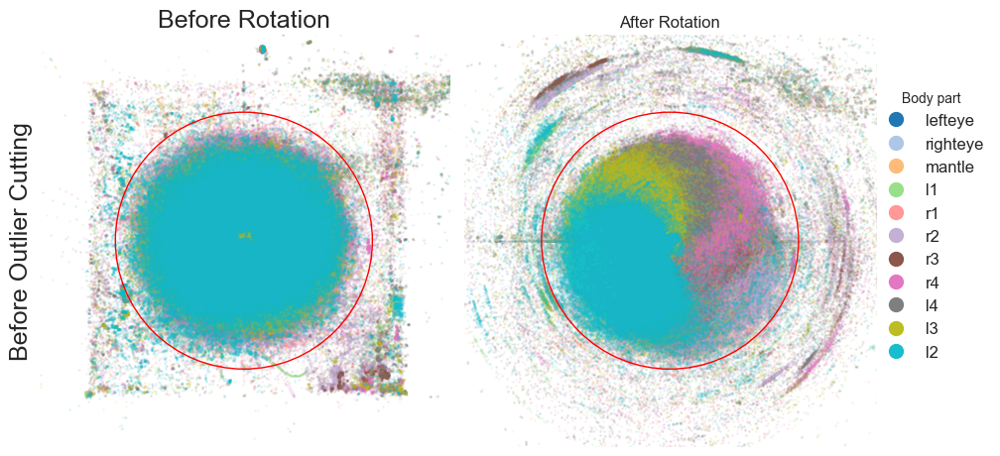

/var/folders/_h/9ln9vcxs5cnbtrz_s6b7zzf00000gn/T/ipykernel_6151/487878221.py:132: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap(colormap)
100%|██████████| 11/11 [00:32<00:00,  2.94s/it]


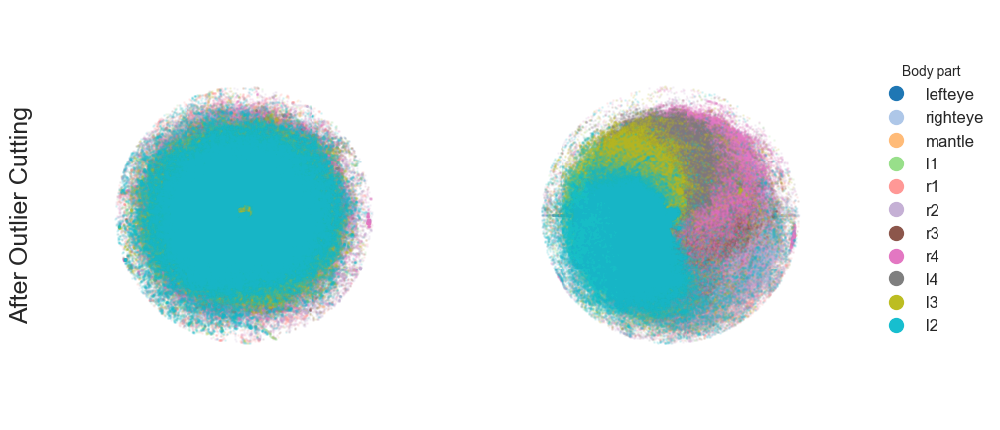

In [6]:
target_dir = 'NotebookPlots/inferencedDLCAnalysis'
if os.path.exists(target_dir) != True:
    os.mkdir(target_dir)

r = 250 ## cut off distance to get rid of outliers 
ss = 1 ## sub-sample if you want it to go faster for trouble shooting
colormap = 'tab20' ## arm tip colormap

dat = df.copy()
dat = dat.iloc[::ss]

rex = np.array(dat['righteye_x'].tolist())
rey = np.array(dat['righteye_y'].tolist())

mex = np.array(dat['Meaneye_x'].tolist())
mey = np.array(dat['Meaneye_y'].tolist())

rex = rex-mex
rey = rey-mey

bda = np.arctan2(rex, rey)

dat['Body_Axis_angle'] = bda

cols = dat.columns[0:33].tolist()
k=3
del cols[k-1::k]
cols_x, cols_y = cols[0::2], cols[1::2]

fig, (ax1, ax2) = plt.subplots(1,2,figsize=(10,5))

norm = mpl.colors.Normalize(vmin = 0, vmax = len(cols_x))
cmap = cm.get_cmap(colormap)
m = cm.ScalarMappable(norm=norm, cmap=cmap)

legend_lines = []
legend_labels = []
for j, col in enumerate(cols_x):
  c = m.to_rgba(j)
  legend_lines.append(Line2D([0], [0], color=c, marker='o', markersize=10, lw=0))
  legend_labels.append(col.split('_')[0])

j = 0
InCirc = [True]*dat.shape[0]
pbar = tqdm(total = int(len(cols_x)), position=0, leave=True)
for xcol, ycol in list(zip(cols_x, cols_y)):
  xarr = np.array(dat[xcol].tolist())-mex
  yarr = np.array(dat[ycol].tolist())-mey

  D = (xarr**2 + yarr**2)**(1/2)
  for i, d in enumerate(D):
    if d > r:
      InCirc[i] = False

  c = m.to_rgba(j)
  ax=ax1
  ax.scatter(xarr, yarr, s=1, alpha=0.1, color=c)

  rot_xy = [rotate((0,0), (x,y), angle - np.pi/2) for x,y,angle in list(zip(xarr, yarr,bda))]
  xarr = [s[0] for s in rot_xy]
  yarr = [s[1] for s in rot_xy]

  ax=ax2
  ax.scatter(xarr, yarr, s=1, alpha=0.1, color=c)

  pbar.update(n=1)
  j += 1
pbar.close()

ax=ax1
circ = plt.Circle((0,0), r, linewidth=1, color='red', fill = False)
ax.set_aspect('equal')
ax.set_xlim(-400, 400)
ax.set_ylim(-400, 400)
ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.add_patch(circ)
ax.set_title('Before Rotation', fontsize=18)
ax.set_ylabel('Before Outlier Cutting', fontsize=18)

ax=ax2
circ = plt.Circle((0,0), r, linewidth=1, color='red', fill = False)
ax.set_aspect('equal')
ax.set_xlim(-400, 400)
ax.set_ylim(-400, 400)
ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.add_patch(circ)
ax.legend(legend_lines, legend_labels, loc="upper right", bbox_to_anchor = (1.3,.9),
           frameon=False, fontsize=12, title='Body part')
ax.set_title('After Rotation')

fig.tight_layout()

name_fig = 'all_tips_rotated_before_circleCut.png'
path_fig = os.path.join(target_dir, name_fig)
fig.savefig(path_fig, dpi=300, bbox_inches='tight')

plt.show(fig)
plt.close(fig)

dat['InCircle'] = InCirc

######### re run with dropped rows #########

dat = dat[(dat['InCircle'] == True)].copy()

rex = np.array(dat['righteye_x'].tolist())
rey = np.array(dat['righteye_y'].tolist())

mex = np.array(dat['Meaneye_x'].tolist())
mey = np.array(dat['Meaneye_y'].tolist())

rex = rex-mex
rey = rey-mey

bda = np.arctan2(rex, rey)

dat['Body_Axis_angle'] = bda

fig, (ax1, ax2) = plt.subplots(1,2,figsize=(10,5))

norm = mpl.colors.Normalize(vmin = 0, vmax = len(cols_x))
cmap = cm.get_cmap(colormap)
m = cm.ScalarMappable(norm=norm, cmap=cmap)

j = 0
pbar = tqdm(total = int(len(cols_x)), position=0, leave=True)
for xcol, ycol in list(zip(cols_x, cols_y)):
  xarr = np.array(dat[xcol].tolist())-mex
  yarr = np.array(dat[ycol].tolist())-mey

  c = m.to_rgba(j)

  ax=ax1
  ax.scatter(xarr, yarr, s=1, alpha=0.1, color=c)

  rot_xy = [rotate((0,0), (x,y), angle - np.pi/2) for x,y,angle in list(zip(xarr, yarr,bda))]
  xarr = [s[0] for s in rot_xy]
  yarr = [s[1] for s in rot_xy]

  dat[xcol] = xarr
  dat[ycol] = yarr

  ax=ax2
  ax.scatter(xarr, yarr, s=1, alpha=0.1, color=c)

  j += 1
  pbar.update(n=1)
pbar.close()

ax=ax1
#circ = plt.Circle((0,0), r, linewidth=1, color='red', fill = False)
ax.set_aspect('equal')
ax.set_xlim(-400, 400)
ax.set_ylim(-400, 400)
ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_ylabel('After Outlier Cutting', fontsize=18)
#ax.add_patch(circ)

ax=ax2
#circ = plt.Circle((0,0), r, linewidth=1, color='red', fill = False)
ax.set_aspect('equal')
ax.set_xlim(-400, 400)
ax.set_ylim(-400, 400)
ax.set_xticks([])
ax.set_yticks([])
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['right'].set_visible(False)
#ax.add_patch(circ)
ax.legend(legend_lines, legend_labels, loc="upper right", bbox_to_anchor = (1.3,.9),
           frameon=False, fontsize=12, title='Body part')

fig.tight_layout()

name_fig = 'all_tips_rotated_after_circleCut.png'
path_fig = os.path.join(target_dir, name_fig)
fig.savefig(path_fig, dpi=300, bbox_inches='tight')

plt.show(fig)
plt.close(fig)

name_dat = 'all_tips_rotated.csv'
path_dat = os.path.join(target_dir, name_dat)
dat.to_csv(path_dat, index=False)

Now we have a rotated dataset.

In [7]:
dat

,lefteye_x,lefteye_y,lefteye_p,righteye_x,righteye_y,righteye_p,mantle_tip_x,mantle_tip_y,mantle_tip_p,l1_tip_x,...,l2_tip_x,l2_tip_y,l2_tip_p,Animal ID,Root,Index,Meaneye_x,Meaneye_y,Body_Axis_angle,InCircle
0,-7.091514,-2.708944e-14,0.999639,7.091514,-4.440892e-16,0.998700,-1.629828,67.371721,0.999813,-7.442511,...,-10.919028,126.643049,0.990198,jos,joseph-14_50-9,0,618.134811,221.389709,1.824976,True
1,-6.877216,1.065814e-13,0.999642,6.877216,0.000000e+00,0.994357,-8.067468,66.878371,0.999930,1.498255,...,-22.144200,116.118250,0.990198,jos,joseph-14_50-9,1,620.051010,230.094574,1.923755,True
2,-4.912697,-2.353673e-14,0.998512,4.912697,4.440892e-16,0.986206,-32.156033,61.497225,0.999568,-2.608494,...,-50.194526,96.467108,0.990198,jos,joseph-14_50-9,2,624.181534,239.036423,2.191086,True
3,-3.520065,1.665335e-16,0.987928,3.520065,-1.665335e-16,0.842734,-68.206158,1.065913,0.996190,65.397498,...,-96.058205,4.944616,0.990198,jos,joseph-14_50-9,3,628.906067,251.099319,-3.083586,True
4,-7.201869,1.859624e-15,0.551609,7.201869,-4.135581e-15,0.949737,-47.844629,3.149648,0.068275,33.062704,...,-145.474333,14.370104,0.854501,jos,joseph-14_50-9,4,630.159149,234.567696,-3.121612,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
440170,-6.580385,-8.215650e-14,1.000000,6.580385,2.220446e-16,1.000000,-2.434960,36.306346,1.000000,-30.031311,...,-107.189051,-40.752430,1.000000,sla,slaanesh_9_9_100_eat_01,2551,1153.118546,227.175125,1.848066,True
440171,-6.576897,-4.773959e-14,1.000000,6.576897,6.661338e-16,1.000000,0.261601,37.949745,1.000000,-33.862144,...,-125.434971,-43.551070,0.999983,sla,slaanesh_9_9_100_eat_01,2552,1150.208679,223.345291,1.780042,True
440172,-6.114338,-1.110223e-15,1.000000,6.114338,1.110223e-15,1.000000,0.250270,38.643584,0.999998,-30.480837,...,-120.015131,-49.190872,0.999515,sla,slaanesh_9_9_100_eat_01,2553,1146.909042,221.107773,1.842763,True
440173,-5.970222,-1.911804e-13,1.000000,5.970222,6.661338e-16,1.000000,-2.850060,35.024094,1.000000,-27.377723,...,-120.826247,-52.079239,0.999949,sla,slaanesh_9_9_100_eat_01,2554,1144.773621,220.900040,1.864234,True


In [8]:
time_after = dat.shape[0]/fps/60/60
print(f'Time recordings = {round(time_after,3)} hours!')
print(f'The subsampling + outlier filter dropped {round(time_after - totalTime,3)} hours!')

Time recordings = 11.361 hours!
The subsampling + outlier filter dropped -0.866 hours!


Now things are going to get crazy, we are going to use a 2D Kernel Density Estimation to see where the arms arm relative to the octopus, and what extent of the area around the octopus they cover.

Some house cleaning first

To make the plots pretty I'm going to load in a background image

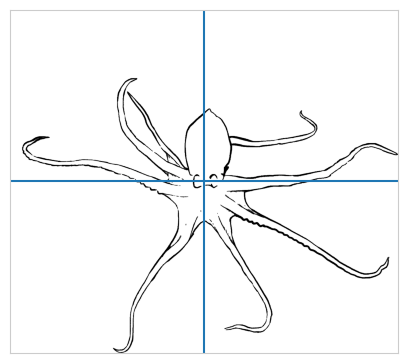

In [9]:
path_background_img = r'../DATA/diagrams/centered_image copy.png'
bg_img = cv2.imread(path_background_img)
bg_img = cv2.cvtColor(bg_img, cv2.COLOR_RGB2GRAY)

z = np.zeros([bg_img.shape[1]-bg_img.shape[0]-110, bg_img.shape[1]])
bg_img = np.vstack([z, bg_img])

z = np.zeros([bg_img.shape[0], 40])
bg_img = np.hstack([z, bg_img])

fig, (ax) = plt.subplots(1,1,figsize=(5,5))


ax.axvline(x = bg_img.shape[1]/2)
ax.axhline(y = bg_img.shape[0]/2)
ax.imshow(bg_img, cmap='Greys')
ax.set_xticks([])
ax.set_yticks([])

plt.show(fig)
plt.close(fig)

Here are the codes for the animals

In [10]:
animals = sorted(list(set(dat['Animal ID'])))
animals, len(animals)

(['jos',
  'kho',
  'kor',
  'kra',
  'lar',
  'lis',
  'mik',
  'nin',
  'nip',
  'nur',
  'sed',
  'sla'],
 12)

We will manually assign sexes to the animals since this is not currently in the dataframe

In [11]:
def sort_animals (an):
  m = 'Male'
  f = 'Female'  
  gender_key = {'jos':m,
              'kho':m,
              'kor':m,
              'kra':m,
              'lar':m,
              'lis':f,
              'mik':m,
              'nin':m,
              'nip':f,
              'nur':f,
              'sed':m,
              'sla':f}

  if gender_key[an] == m:
    return 1
  elif gender_key[an] == f:
    return 0
  else:
    return -1

animals = sorted(animals, key=sort_animals)

m = 'Male'
f = 'Female'
gender_key = {'jos':m,
              'kho':m,
              'kor':m,
              'kra':m,
              'lar':m,
              'lis':f,
              'mik':m,
              'nin':m,
              'nip':f,
              'nur':f,
              'sed':m,
              'sla':f}
dat['Sex'] = [gender_key[s] for s in dat['Animal ID'].tolist()]
animals, len(animals), gender_key

(['lis',
  'nip',
  'nur',
  'sla',
  'jos',
  'kho',
  'kor',
  'kra',
  'lar',
  'mik',
  'nin',
  'sed'],
 12,
 {'jos': 'Male',
  'kho': 'Male',
  'kor': 'Male',
  'kra': 'Male',
  'lar': 'Male',
  'lis': 'Female',
  'mik': 'Male',
  'nin': 'Male',
  'nip': 'Female',
  'nur': 'Female',
  'sed': 'Male',
  'sla': 'Female'})

Getting the body parts we care about, the arm tips!

In [12]:
cols = dat.columns[0:33].tolist()
k=3
del cols[k-1::k]
cols_x, cols_y = cols[0::2], cols[1::2]
cols_x = np.array(cols_x[3:])
cols_y = np.array(cols_y[3:])
cols_x = np.roll(cols_x, -5).tolist()
cols_y = np.roll(cols_y, -5).tolist()
cols_x, cols_y

(['l4_tip_x',
  'l3_tip_x',
  'l2_tip_x',
  'l1_tip_x',
  'r1_tip_x',
  'r2_tip_x',
  'r3_tip_x',
  'r4_tip_x'],
 ['l4_tip_y',
  'l3_tip_y',
  'l2_tip_y',
  'l1_tip_y',
  'r1_tip_y',
  'r2_tip_y',
  'r3_tip_y',
  'r4_tip_y'])

The next block of code does a lot! 

It is built off of a stackoverflow example https://stackoverflow.com/questions/30145957/plotting-2d-kernel-density-estimation-with-python to estimate a 2-D kernel density estimation for a point cloud.

We will also grab how far the arm tips are from the mid point of the octopuses eyes

In [13]:
for animal in animals:
    print(f'{gender_key[animal]}:{animal}')

Female:lis
Female:nip
Female:nur
Female:sla
Male:jos
Male:kho
Male:kor
Male:kra
Male:lar
Male:mik
Male:nin
Male:sed


  0%|          | 0/12 [00:00<?, ?it/s]

Female:lis


  8%|▊         | 1/12 [00:01<00:20,  1.83s/it]

Female:nip


 17%|█▋        | 2/12 [00:10<00:56,  5.67s/it]

Female:nur


 25%|██▌       | 3/12 [00:14<00:45,  5.07s/it]

Female:sla


 33%|███▎      | 4/12 [00:17<00:35,  4.43s/it]

Male:jos


 42%|████▏     | 5/12 [00:18<00:21,  3.12s/it]

Male:kho


 50%|█████     | 6/12 [00:25<00:27,  4.51s/it]

Male:kor


 58%|█████▊    | 7/12 [00:28<00:19,  3.85s/it]

Male:kra


 67%|██████▋   | 8/12 [00:43<00:30,  7.53s/it]

Male:lar


 75%|███████▌  | 9/12 [00:48<00:20,  6.71s/it]

Male:mik


 83%|████████▎ | 10/12 [00:50<00:10,  5.04s/it]

Male:nin


 92%|█████████▏| 11/12 [00:52<00:04,  4.37s/it]

Male:sed


100%|██████████| 12/12 [00:53<00:00,  4.46s/it]


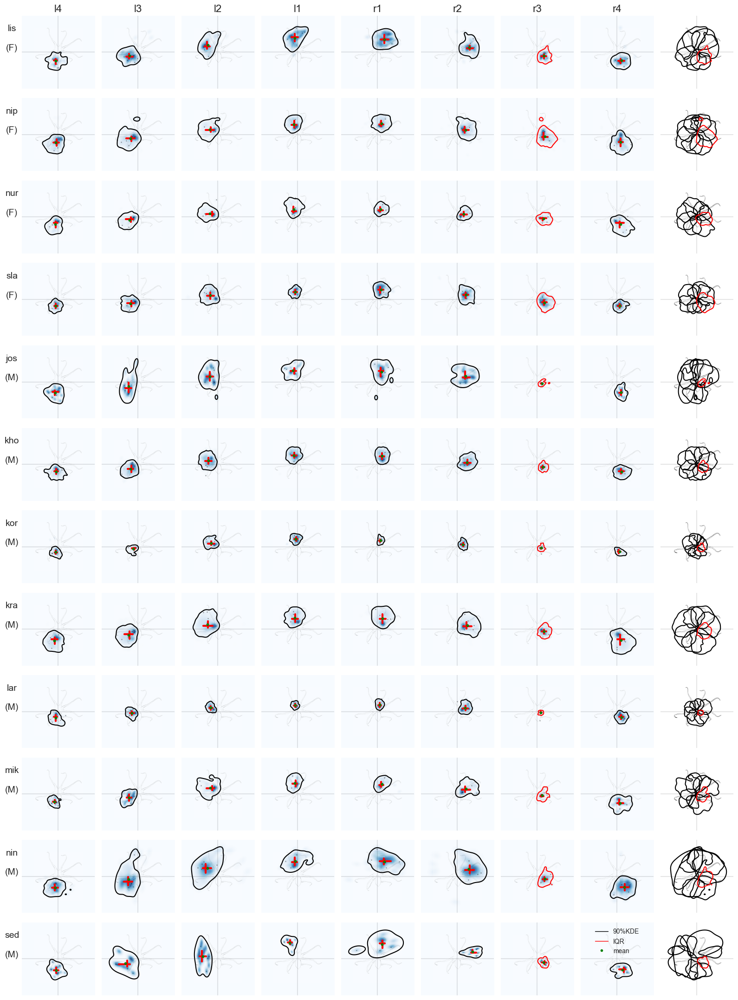

In [14]:
dcols = ['Animal ID', 'Sex', 'Body part', 'Distance Mean', 'Mean X', 'Mean Y', 'x', 'y', 'D', 'KDE']
D_Dict = {k:[] for k in dcols}

pthresh = .99 ## threshold for dropping DLC coordinates beneath a model confidence of .99
r = 300 
nbins = 300j ## number of bins for calculating the kernel density, more equals better resolution but slower.
ss = 1 ## sub sample parameter if you want it to go faster for trouble shooting
GaussKernel = 0.3 ## Kernel size for the gaussian blur (fixed for between animal comparison)

plotKthresh = 0.9 ## Kernel density threshold. 0.9 -> 90% KDE contour, Contour contains 90% of arm tip predictions

ns = 5
fig, axs = plt.subplots(len(animals),9,figsize=(16,int(len(animals)*2)))

pbar = tqdm(total=len(animals), position=0, leave=True)
for i, animal in enumerate(animals[0:]):
  gender = gender_key[animal][0] ## Grab the animals sex
  print(f'{gender_key[animal]}:{animal}')

  df = dat[dat['Animal ID'] == animal] ## subset big dataframe for the animal
  df = df.iloc[::ss]

  j = 0
  for xcol, ycol in list(zip(cols_x, cols_y)): ## iterate over the x,y bodypart columns

    x = np.array(df[xcol].tolist())
    y = np.array(df[ycol].tolist())
    p = np.array(df[xcol[:-2] + '_p'].tolist())
    idxs = np.where(p>pthresh)
    x=x[idxs]
    y=y[idxs]

    IQR = pd.DataFrame(list(zip(x,y)), columns=['x','y'])
    x_IQR = IQR['x'].describe()
    y_IQR = IQR['y'].describe()

    D = (x**2 + y**2)**(1/2)
    D_mean = np.mean(D)
    D_Dict['Animal ID'].append(animal)
    D_Dict['Sex'].append(gender)
    D_Dict['Body part'].append(xcol.split('_')[0])
    D_Dict['Distance Mean'].append(D_mean)
    D_Dict['x'].append(x)
    D_Dict['y'].append(y)
    D_Dict['D'].append(D)
    D_Dict['Mean X'].append(np.mean(x))
    D_Dict['Mean Y'].append(np.mean(y))

    X, Y = np.mgrid[-r:r:nbins, 
                    -r:r:nbins]
    positions = np.vstack([X.ravel(),
                           Y.ravel()])
    values = np.vstack([x,y])
    kernel = stats.gaussian_kde(values, GaussKernel)
    Z = np.reshape(kernel(positions).T, X.shape)
    f = np.reshape(kernel(positions).T, X.shape)
    Z = np.rot90(Z)
    D_Dict['KDE'].append(Z)

    ax=axs[i, j]
    ax.imshow(Z, cmap='Blues', zorder=0, extent=[-300, 300, -300, 300])
    ax.imshow(bg_img, cmap='Greys', zorder=1, extent=[-200, 200, -200, 200], alpha=0.25)

    if i == 0:
      ax.set_title(xcol.split('_')[0], fontsize=16)

    idxs = random.sample(np.arange(0, len(x)).tolist(), ns)
    ax.scatter(x[idxs], y[idxs], color='black', s=1, alpha=0.25, zorder=2)

    ax.axhline(y=0, color='black', alpha=0.1, zorder=1)
    ax.axvline(x=0, color='black', alpha=0.1, zorder=1)

    c = 'black'
    if j == 6:
      c = 'red'
    g = sns.kdeplot(x=x, y=y, levels=1, thresh=1-plotKthresh, color=c, alpha=1, ax=ax, weights=GaussKernel, zorder=3)

    ax.plot([x_IQR['25%'], x_IQR['75%']], [y_IQR['50%'], y_IQR['50%']], color='red', linewidth=3, zorder=2)
    ax.plot([x_IQR['50%'], x_IQR['50%']],[y_IQR['25%'], y_IQR['75%']], color='red', linewidth=3, zorder=2)
    ax.scatter(x_IQR['mean'], y_IQR['mean'], color='green', s=10, zorder=3)

    ax.set_xlim(-300, 300)
    ax.set_ylim(300, -300)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')

    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['right'].set_visible(False)

    if j == 0:
      ax.set_ylabel(animal +'\n\n('+gender+')', rotation=0,fontsize=14, labelpad=15)

    if j == 7 and i == len(animals)-1:
      legend_lines = []
      legend_labels = []
      legend_lines.append(Line2D([0], [0], color='black', lw=1))
      legend_labels.append(f'{round(plotKthresh*100)}%KDE')
      legend_lines.append(Line2D([0], [0], color='red', lw=1))
      legend_labels.append(f'IQR')
      legend_lines.append(Line2D([0], [0], color='green', markersize=3, marker='o', lw=0))
      legend_labels.append(f'mean')
      ax.legend(legend_lines, legend_labels, loc="upper center", bbox_to_anchor = (.5,1),
           frameon=False, fontsize=10,)
      
    ax=axs[i, 8]
    if j == 7:
      ax.imshow(bg_img, cmap='Greys', zorder=1, extent=[-200, 200, -200, 200], alpha=1)
      ax.axhline(y=0, color='black', alpha=0.1, zorder=1)
      ax.axvline(x=0, color='black', alpha=0.1, zorder=1)

    c = 'black'
    o = 3
    if j == 6:
      o = 4
      c = 'red'
    g = sns.kdeplot(x=x, y=y, levels=1, thresh=1-plotKthresh, color=c, alpha=1, ax=ax, weights=GaussKernel, zorder=o)
    
    ax.set_xlim(-300, 300)
    ax.set_ylim(300, -300)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')

    ax.spines['top'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['right'].set_visible(False)

    j += 1

  pbar.update(n=1)
pbar.close()

DatDist = pd.DataFrame(D_Dict, columns = dcols)
"""name_dat = 'all_tips_KDE_Dist.pkl'
path_dat = os.path.join(target_dir, name_dat)
DatDist.to_pickle(path_dat)"""

fig.tight_layout(h_pad=-15)

fig_name = 'inferencedArmTips_all_arms_kde.png'
path_fig = os.path.join(target_dir, fig_name)
fig.savefig(path_fig, dpi=300, bbox_inches='tight')

plt.show(fig)
plt.close(fig)


In [15]:
DatDist

,Animal ID,Sex,Body part,Distance Mean,Mean X,Mean Y,x,y,D,KDE
0,lis,F,l4,82.715105,-17.657377,73.266458,"[-5.5954718067064775, -32.806020142751194, -40...","[56.01653410757857, 35.57286218211169, 5.33450...","[56.295305294182036, 48.39073755827771, 41.326...","[[2.419233868147069e-192, 2.06462844153945e-19..."
1,lis,F,l3,90.662510,-69.470576,28.735840,"[-45.629707526039134, -55.86690998150492, -34....","[25.602089438177323, 14.730516762864887, 25.04...","[52.32147926532949, 57.7762905955602, 42.28947...","[[8.212022684450552e-80, 4.03351643630116e-79,..."
2,lis,F,l2,113.082323,-81.981180,-56.766668,"[-50.9676538396767, -71.83823503201349, 8.5012...","[-25.218791613550977, -37.21011845416921, -65....","[56.865536033425556, 80.90318243362317, 66.315...","[[3.1458587567795495e-102, 1.898652370432478e-..."
3,lis,F,l1,126.207463,-22.633388,-115.338898,"[-36.579290800751025, -45.97832700381616, -30....","[-110.00355855406153, -105.16757084620076, -16...","[115.92595658454906, 114.77902470295044, 163.0...","[[1.9497731638871387e-139, 2.4171127111537277e..."
4,lis,F,r1,127.378890,56.260940,-104.987389,"[-11.905617484419523, 2.7719360830046753, 34.5...","[-167.40585842425182, -144.055954298946, -108....","[167.82867800958797, 144.0826207376458, 114.22...","[[6.167488884953173e-282, 1.0282019056662452e-..."
...,...,...,...,...,...,...,...,...,...,...
91,sed,M,l1,146.677275,-64.303172,-129.906674,"[-61.123743106200244, -86.81062108037206, -89....","[-118.97263403539907, -157.94582642069673, -15...","[133.75574612192838, 180.23031935852745, 177.8...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
92,sed,M,r1,147.443353,35.981642,-122.138834,"[10.662919952996788, 38.41610796382369, 31.118...","[-165.2379758522796, -156.77063524729823, -145...","[165.58166119979154, 161.40888893406577, 148.4...","[[5.137186257624604e-164, 8.88978339330966e-16..."
93,sed,M,r2,140.150407,126.061463,-57.258938,"[111.64135818400723, 46.39642675460093, 165.73...","[-53.6507139152215, -51.72002707054262, -84.57...","[123.86360224368876, 69.48085790901484, 186.06...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."
94,sed,M,r3,62.876685,53.137440,29.395477,"[54.08180771671144, 24.187652925730806, 43.170...","[36.04690819158908, 22.82821838313127, 58.5184...","[64.99401138628235, 33.25913571642454, 72.7193...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,..."


Now that we have the kernel density estimations, we will calculate the 90% kernel density areas

The animals are different in size

In [16]:
thresh = 0.1
KDE_AREAS = []

show_plots=False

for i in range(0, DatDist.shape[0]):
    Z = DatDist['KDE'][i]
    an = DatDist['Animal ID'][i]
    part = DatDist['Body part'][i]
    Zs = (Z - Z.min())/(Z.max() - Z.min())
    Z_area = np.sum(np.where(Zs > thresh, 1, 0))
    KDE_AREAS.append(Z_area)

    if show_plots == True:
        fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(15,5))

        ax=ax1
        ax.imshow(Zs, extent = [-300, 300, 300, -300], zorder=0, cmap='Blues')
        ax.set_title(f'{an} {part}')
        ax.axhline(y=0, color='black', linewidth=1, zorder=1)
        ax.axvline(x=0, color='black', linewidth=1, zorder=1)
        ax.set_ylim(-300, 300)
        ax.spines['top'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_xticks([])
        ax.set_yticks([])

        ax=ax2
        ax.imshow(np.where(Zs > thresh, 1, 0), extent = [-300, 300, 300, -300], zorder=0, cmap='Blues')
        ax.set_title(f'area = {Z_area}')
        ax.axhline(y=0, color='black', linewidth=1, zorder=1)
        ax.axvline(x=0, color='black', linewidth=1, zorder=1)
        ax.set_ylim(-300, 300)
        ax.spines['top'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_xticks([])
        ax.set_yticks([])

        ax=ax3
        CS = ax.contour(Y, X, Zs, [thresh],
                    colors=('k',),
                    linewidths=(3,), zorder=1)
        ax.set_ylim(-300, 300)
        ax.axhline(y=0, color='black', linewidth=1, zorder=0)
        ax.axvline(x=0, color='black', linewidth=1, zorder=0)
        ax.spines['top'].set_visible(False)
        ax.spines['bottom'].set_visible(False)
        ax.spines['left'].set_visible(False)
        ax.spines['right'].set_visible(False)
        ax.set_xticks([])
        ax.set_yticks([])

        figname = 'inferencedArmTips_summary.png'
        fig.savefig(os.path.join(target_dir, figname), dpi=300)

        plt.show(fig)
        plt.close(fig)

DatDist[f'{int((1-thresh)*100)}%KDE Area'] = KDE_AREAS

In [17]:
DatDist

,Animal ID,Sex,Body part,Distance Mean,Mean X,Mean Y,x,y,D,KDE,90%KDE Area
0,lis,F,l4,82.715105,-17.657377,73.266458,"[-5.5954718067064775, -32.806020142751194, -40...","[56.01653410757857, 35.57286218211169, 5.33450...","[56.295305294182036, 48.39073755827771, 41.326...","[[2.419233868147069e-192, 2.06462844153945e-19...",2508
1,lis,F,l3,90.662510,-69.470576,28.735840,"[-45.629707526039134, -55.86690998150492, -34....","[25.602089438177323, 14.730516762864887, 25.04...","[52.32147926532949, 57.7762905955602, 42.28947...","[[8.212022684450552e-80, 4.03351643630116e-79,...",4592
2,lis,F,l2,113.082323,-81.981180,-56.766668,"[-50.9676538396767, -71.83823503201349, 8.5012...","[-25.218791613550977, -37.21011845416921, -65....","[56.865536033425556, 80.90318243362317, 66.315...","[[3.1458587567795495e-102, 1.898652370432478e-...",4935
3,lis,F,l1,126.207463,-22.633388,-115.338898,"[-36.579290800751025, -45.97832700381616, -30....","[-110.00355855406153, -105.16757084620076, -16...","[115.92595658454906, 114.77902470295044, 163.0...","[[1.9497731638871387e-139, 2.4171127111537277e...",6313
4,lis,F,r1,127.378890,56.260940,-104.987389,"[-11.905617484419523, 2.7719360830046753, 34.5...","[-167.40585842425182, -144.055954298946, -108....","[167.82867800958797, 144.0826207376458, 114.22...","[[6.167488884953173e-282, 1.0282019056662452e-...",7013
...,...,...,...,...,...,...,...,...,...,...,...
91,sed,M,l1,146.677275,-64.303172,-129.906674,"[-61.123743106200244, -86.81062108037206, -89....","[-118.97263403539907, -157.94582642069673, -15...","[133.75574612192838, 180.23031935852745, 177.8...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",1490
92,sed,M,r1,147.443353,35.981642,-122.138834,"[10.662919952996788, 38.41610796382369, 31.118...","[-165.2379758522796, -156.77063524729823, -145...","[165.58166119979154, 161.40888893406577, 148.4...","[[5.137186257624604e-164, 8.88978339330966e-16...",5965
93,sed,M,r2,140.150407,126.061463,-57.258938,"[111.64135818400723, 46.39642675460093, 165.73...","[-53.6507139152215, -51.72002707054262, -84.57...","[123.86360224368876, 69.48085790901484, 186.06...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",1565
94,sed,M,r3,62.876685,53.137440,29.395477,"[54.08180771671144, 24.187652925730806, 43.170...","[36.04690819158908, 22.82821838313127, 58.5184...","[64.99401138628235, 33.25913571642454, 72.7193...","[[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0,...",792


In [20]:
## do females then males
females = [animal for animal in animals if gender_key[animal] == 'Female']
males = [animal for animal in animals if gender_key[animal] == 'Male']

female_areas = [DatDist[DatDist['Animal ID'] == animal]['90%KDE Area'].mean() for animal in females]
male_areas = [DatDist[DatDist['Animal ID'] == animal]['90%KDE Area'].mean() for animal in males]

## sort the sexes by their areas
## then concatenate the sorted lists in area_sorted_animals
# Sort females and males by their corresponding areas
sorted_females = [animal for area, animal in sorted(zip(female_areas, females))]
sorted_males = [animal for area, animal in sorted(zip(male_areas, males))]

# Concatenate the sorted lists
area_sorted_animals = sorted_females + sorted_males
area_sorted_animals

['lis',
 'jos',
 'lar',
 'nip',
 'kho',
 'mik',
 'nur',
 'kor',
 'nin',
 'sla',
 'kra',
 'sed']

100%|██████████| 12/12 [10:53<00:00, 54.46s/it]


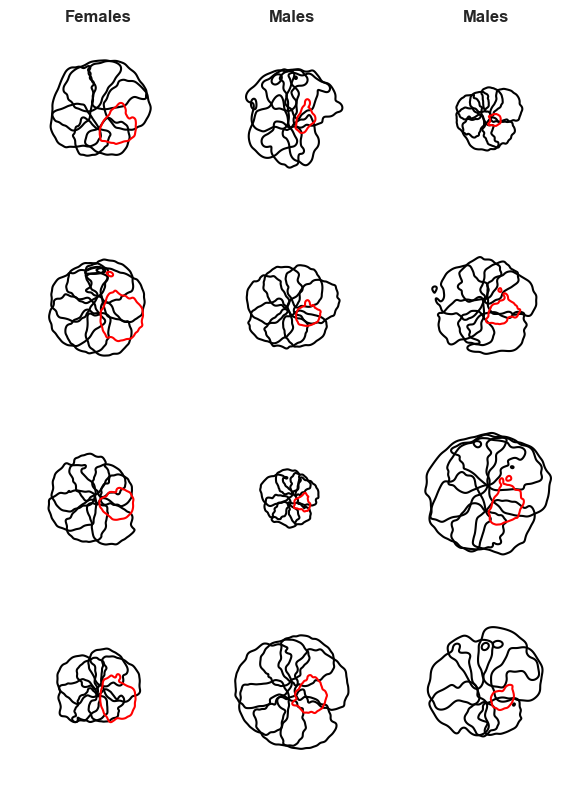

In [21]:
r = 300

GaussKernel = 0.3 ## Kernel size for the gaussian blur (fixed for between animal comparison)

color_key = {True: 'red', False:'black'}

ss = 1

scale_bar_length_cm = 20
scale_bar_length_px = scale_bar_length_cm/2.54 * 20
sx0 = 100
sx1 = sx0 + scale_bar_length_px
sy0 = r - 50
sy1 = sy0
scale_bar_text = f'{scale_bar_length_cm} cm'
stx = sx0 + (sx1-sx0)/2 - scale_bar_length_px/2
sty = sy0 - 17.5

nrows = 3
ncols = 4

fig, axs = plt.subplots(nrows, ncols, figsize=(int(2*ncols), int(2*nrows)))

pbar = tqdm(total = len(area_sorted_animals), position=0, leave=True)
for i, animal in enumerate(area_sorted_animals):
    sex = gender_key[animal]

    tmp = dat[dat['Animal ID'] == animal] ## subset big dataframe for the animal
    tmp = tmp.iloc[::ss]

    # Calculate row and column index for the subplot
    row_idx = i // ncols  # Integer division to find the row index
    col_idx = i % ncols   # Modulo operation to find the column index

    ax = axs[row_idx, col_idx]  # Assign subplot to the correct position

    if col_idx == 0:
        ax.set_ylabel(sex + 's', rotation = 0, fontweight='bold')

    if col_idx == 3 and row_idx == 0:
        legend_lines = []
        legend_labels = []
        legend_lines.append(Line2D([0], [0], color='black', lw=1))
        legend_labels.append(f'other')
        legend_lines.append(Line2D([0], [0], color='red', lw=1))
        legend_labels.append(f'R3')

        ax.legend(legend_lines, legend_labels, loc="upper right", bbox_to_anchor = (.3,1),
                   frameon=False, fontsize=10, title='90%KDE')

    for xcol, ycol in list(zip(cols_x, cols_y)):
        x = np.array(tmp[xcol].tolist())
        y = np.array(tmp[ycol].tolist())
        p = np.array(tmp[xcol[:-2] + '_p'].tolist())
        idxs = np.where(p>pthresh)
        x=x[idxs]
        y=y[idxs]

        if 'r3' in xcol:
            color = color_key[True]
            g = sns.kdeplot(x=x, y=y, levels=1,
                            thresh=1-plotKthresh,
                            color=color, alpha=1,
                            ax=ax,
                            weights=GaussKernel, zorder=4)

        else:
            color = color_key[False]

            g = sns.kdeplot(x=x, y=y, levels=1,
                            thresh=1-plotKthresh,
                            color=color, alpha=1,
                            ax=ax,
                            weights=GaussKernel, zorder=3)

    for spine in ax.spines.values():
        spine.set_visible(False)

    ax.set_ylim(r, -r)
    ax.set_xlim(-r, r)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_aspect('equal')

    if col_idx == 3 and row_idx == 2:
        ax.plot([sx0, sx1], [sy0, sy1], color='black', linewidth=3, alpha=1)
        ax.text(stx, sty, scale_bar_text, color='black', fontweight='bold',
                fontsize=12)

    pbar.update(n=1)
pbar.close()

fig.tight_layout(w_pad=-4, h_pad=-4)

figname = 'inferencedArmTips_allAnimalsAllArms.png'
fig.savefig(os.path.join(target_dir, figname), dpi=300)

plt.show(fig)
plt.close(fig)

![comparing_reach_measures%20%281%29.png](../DATA/diagrams/comparing_reach_measures%20%281%29.png)
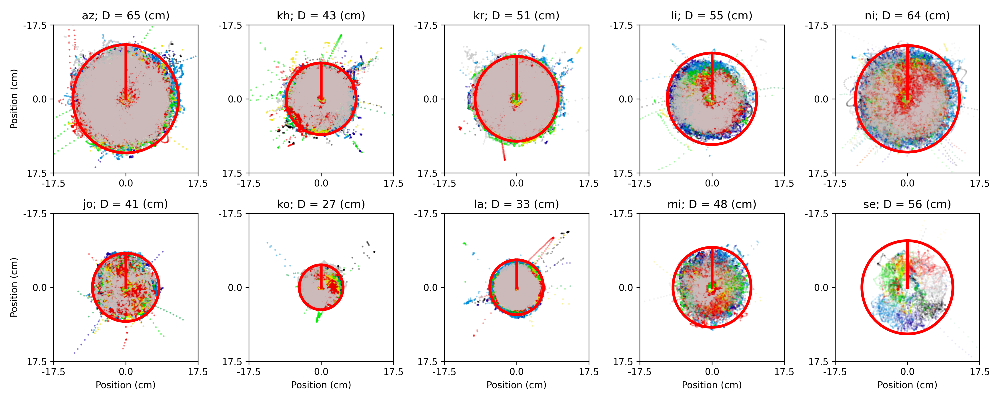

*Figure 6*. Manually defined circles showing the radius of 10 different octopuses

![rs_comparing_measurements%20%281%29.png](../DATA/diagrams/rs_comparing_measurements%20%281%29.png)
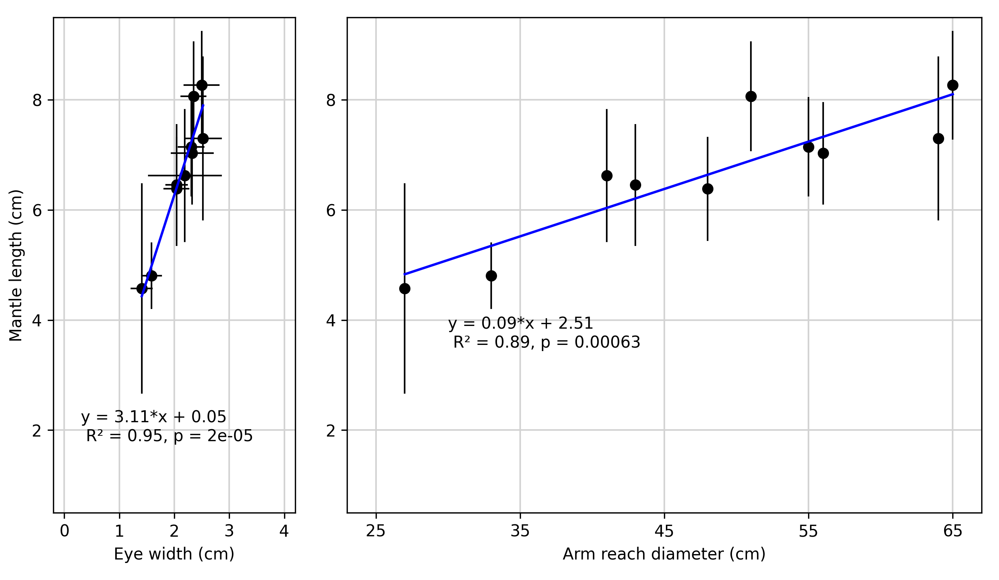

*Figure 7*. Comparison of eye width, mantle tip, and arm reach diameter measurements for the 10 octopus in Figure 6.

So, because of this issue, we really need to normalize the data before we compare it. 

In [26]:
cols = ['Animal ID', 'Sex', 'Body part', 'Distance_Mean', 'Mean X', 'Mean Y', 'x', 'y', 
        'D', 'KDE', f'{int((1-thresh)*100)}%KDE Area', 'Norm_KDE_Area','Norm_distance_mean']
df = pd.DataFrame(columns=cols)

for animal in sorted(animals, key=sort_animals):
  tmp = DatDist[DatDist['Animal ID'] == animal].copy()

  A = np.array(tmp[f'{int((1-thresh)*100)}%KDE Area'].tolist())
  maxA = np.max(A)
  A = A/maxA
  tmp['Norm_KDE_Area'] = A

  D = np.array(tmp['Distance Mean'].tolist())
  maxD = np.max(D)
  norm = D/maxD
  tmp['Norm_distance_mean'] = norm
  
  df = pd.concat([df, tmp])


Lets visualize the raw distance data just to see what it looks like.

Note it is dramatically different than the KDE data. Each octopus has **Many** data points. So we cannot compare them or fall into the p-value trap of large datasets. 

Instead we will compare the means. 

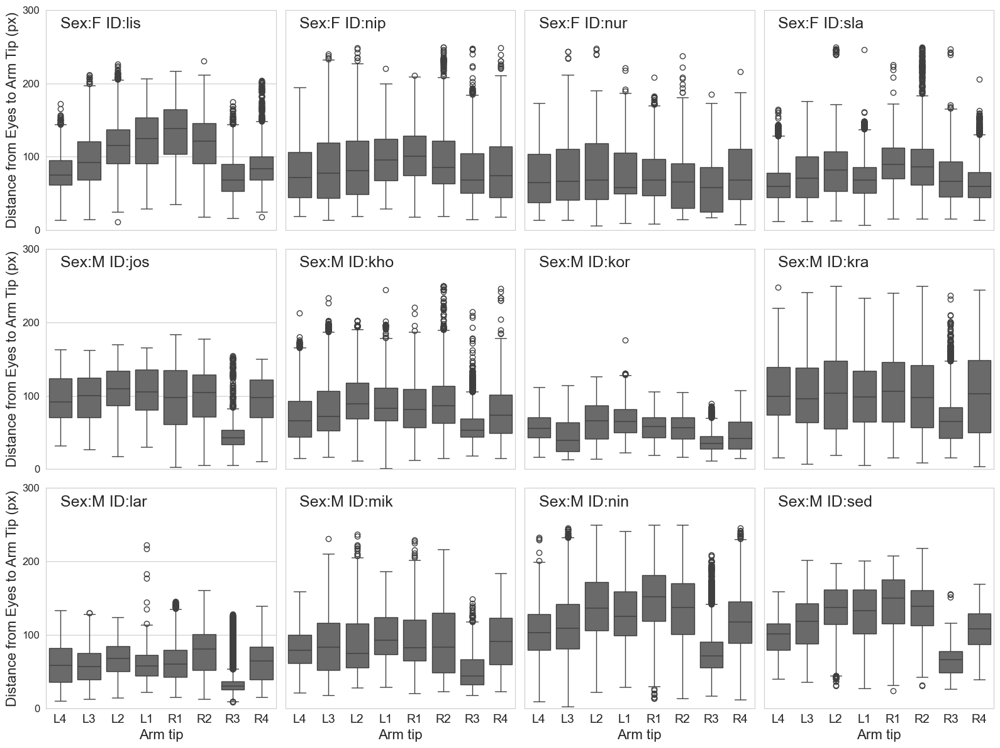

In [27]:
bodyparts = ['l4', 'l3', 'l2', 'l1', 'r1', 'r2', 'r3', 'r4']

fig, axs = plt.subplots(3,4,figsize=(16,12))

yticks = [0, 100, 200, 300]
xticks = [0,1,2,3,4,5,6,7]
xlabs = ['L4', 'L3','L2','L1',
        'R1','R2','R3','R4']

j = 0 
i = 0
for animal in sorted(animals, key=sort_animals):
    tmp = DatDist[DatDist['Animal ID'] == animal].copy()
    sex = tmp['Sex'].tolist()[0]
    dct = {'Body part':[],
         'D':[]}
    for part in bodyparts:
        tmp_tmp = tmp[tmp['Body part'] == part]
        dct['D'] = dct['D'] + tmp_tmp['D'].tolist()[0].tolist()
        dct['Body part'] = dct['Body part'] + [part]*len(tmp_tmp['D'].tolist()[0].tolist())
    tmp = pd.DataFrame(dct)

    ax=axs[j ,i%4]
    g = sns.boxplot(data=tmp, 
                  x='Body part', y = 'D', ax=ax, saturation=0,
                   hue_order=bodyparts)
    ax.set_ylim(0,300)
    ax.text(0,275,f'Sex:{sex} ID:{animal}', fontsize=18)

    if i in [0,4,8]:
        ax.set_ylabel('Distance from Eyes to Arm Tip (px)', fontsize=16)
        ax.set_yticks(yticks)
        ax.set_yticklabels(yticks,fontsize=12)
    else:
        ax.set_ylabel('')
        ax.set_yticks([])
    ax.set_xlabel('')
    
    if i >= 8:
        ax.set_xticks(xticks)
        ax.set_xticklabels(xlabs,fontsize=14)
        ax.set_xlabel('Arm tip', fontsize=16)
    else:
        ax.set_xticks([])

    i += 1
    if i%4 == 0:
        j += 1

fig.tight_layout()

fig_name = 'all_animals_distance_raw_boxplot.png'
path_fig = os.path.join(target_dir, fig_name)
fig.savefig(path_fig, dpi=300, bbox_inches='tight')

plt.show(fig)
plt.close(fig)

Converting pixels to cm

In [28]:
df['Distance_mean_cm'] = np.array(df['Distance Mean'].tolist())/20 * 2.54

In [29]:
## going from pixel area to cm^2
## px^2 * in^2/px^2 * cm^2/in^2 = in^2
## 1 in = 20 px
## 1 in^2 = 20^2 px^2 
## 1/20^2 = in^2/px^2
## 2.54^2 cm^2 = 1 in^2
## 2.54^2/1 = cm^2/in^2
a = np.array(df['90%KDE Area'].tolist())
a = a*(1/(20**2))
a = a*((2.54**2))
df['KDE_Area_cm_2'] = a

The difference in distance between R3 and the other arm tips is visually apparent.

Just to show again why we are normalizing the data.

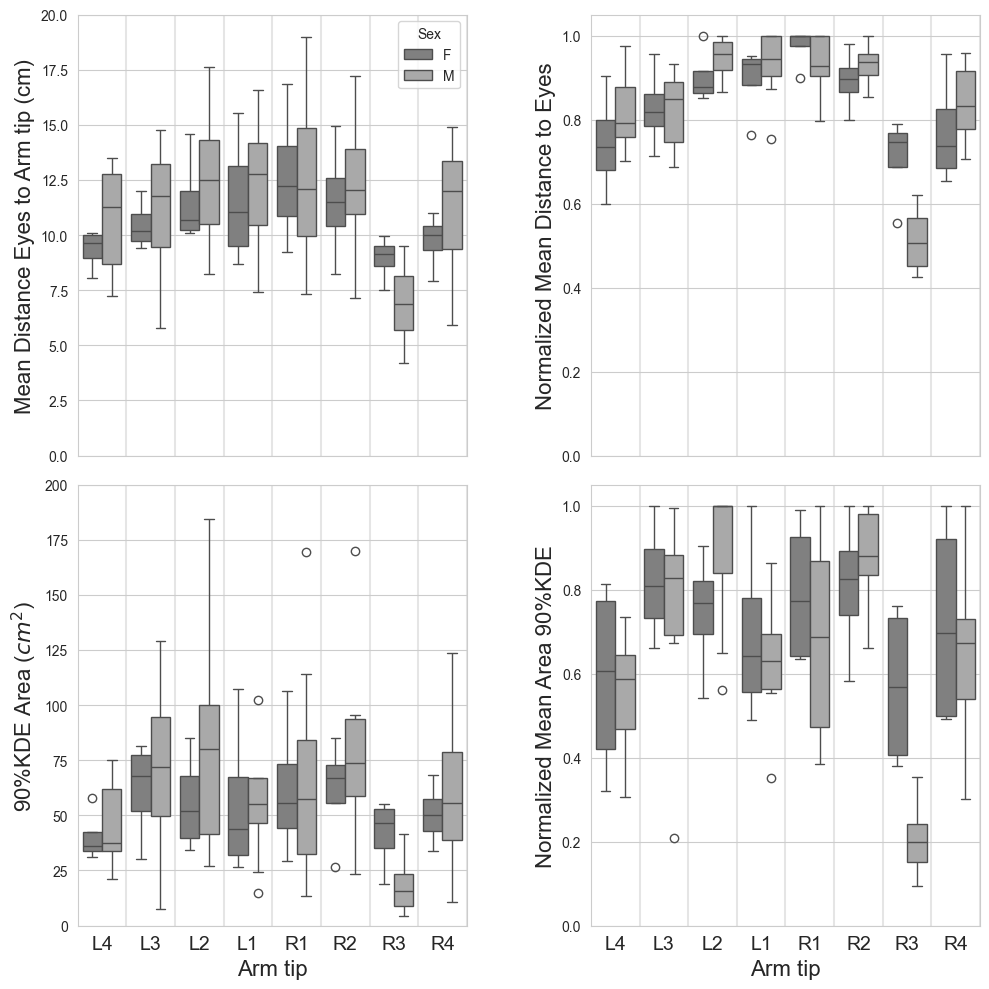

In [30]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2,figsize=(10,10))

xticks = [0,1,2,3,4,5,6,7]
xlabs = ['L4', 'L3','L2','L1',
        'R1','R2','R3','R4']

ax=ax1 
g = sns.boxplot(data=df, x='Body part', 
                y = 'Distance_mean_cm', hue='Sex', ax=ax,
               palette = ['grey','darkgrey']) 
ax.set_ylim(0, 20)
ax.set_ylabel('Mean Distance Eyes to Arm tip (cm)', fontsize=16)
ax.set_xlabel('')
ax.set_xticks(xticks)
ax.set_xticklabels([])
for xtick in xticks:
    ax.axvline(x=xtick+.5, color='black',alpha=0.1,zorder=0)

ax=ax2 
g = sns.boxplot(data=df, x='Body part', 
                y = 'Norm_distance_mean', hue='Sex', ax=ax,
               palette = ['grey','darkgrey']) 
ax.set_ylim(0, 1.05)
ax.set_ylabel('Normalized Mean Distance to Eyes', fontsize=16)
ax.legend([],[], frameon=False)
ax.set_xlabel('')
ax.set_xticks(xticks)
ax.set_xticklabels([])
for xtick in xticks:
    ax.axvline(x=xtick+.5, color='black',alpha=0.1,zorder=0)

ax=ax3 
g = sns.boxplot(data=df, x='Body part', 
                y = 'KDE_Area_cm_2', hue='Sex', ax=ax,
               palette = ['grey','darkgrey']) 
ax.set_ylim(0, 200)
ax.set_ylabel(r'90%KDE Area ($cm^2$)', fontsize=16)
ax.legend([],[], frameon=False)
ax.set_xlabel('Arm tip', fontsize=16)
ax.set_xticks(xticks)
ax.set_xticklabels(xlabs,fontsize=14)
for xtick in xticks:
    ax.axvline(x=xtick+.5, color='black',alpha=0.1,zorder=0)

ax=ax4 
g = sns.boxplot(data=df, x='Body part', 
                y = 'Norm_KDE_Area', hue='Sex', ax=ax,
               palette = ['grey','darkgrey']) 
ax.set_ylim(0, 1.05)
ax.set_ylabel('Normalized Mean Area 90%KDE', fontsize=16)
ax.legend([],[], frameon=False)
ax.set_xlabel('Arm tip',fontsize=16)
ax.set_xticks(xticks)
ax.set_xticklabels(xlabs,fontsize=14)
for xtick in xticks:
    ax.axvline(x=xtick+.5, color='black',alpha=0.1,zorder=0)

fig.tight_layout(w_pad = 5)
fig_name = 'all_arms_area_kde_gender_boxplot.png'
path_fig = os.path.join(target_dir, fig_name) 
fig.savefig(path_fig, dpi=300, bbox_inches='tight')

plt.show(fig) 
plt.close(fig)

The normalization clearly improves the trend we are interested in. 

Lets convert 'pixels' to cm. I know that 20 pixels ~ 1 inch. we will use this information for the conversion.

Now we are going to investigate the differences between the sexes. 

Starting with the un-normalized arm tip distance data.

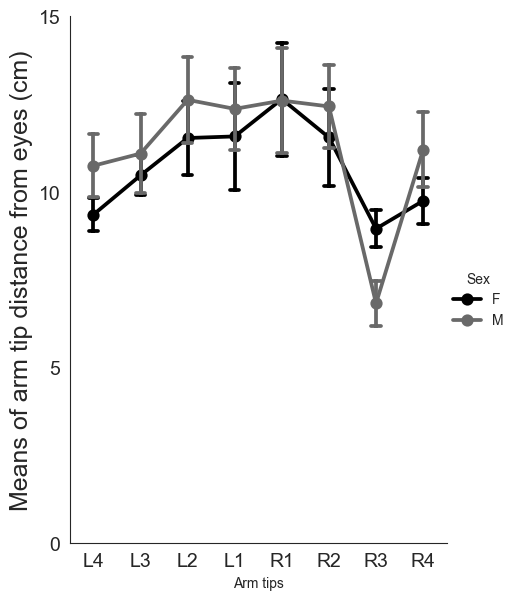

In [31]:
sns.set_style("white")
g = sns.catplot(data=df, 
                x='Body part', 
                y='Distance_mean_cm', 
                hue="Sex", 
                capsize=.2, 
                palette=['black', 'dimgray'], 
                hue_order=['F', 'M'],
                errorbar="se",
                kind="point", 
                height=6, aspect=.75)
ax = g.ax
fig = g.fig
ax.set_aspect('auto')
ax.set_ylabel('Means of arm tip distance from eyes (cm)', fontsize=18)
ax.set_xlabel('Arm tips')
ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7])
ax.set_xticklabels(['L4', 'L3', 'L2', 'L1', 'R1', 'R2', 'R3', 'R4'], fontsize=14)
ax.set_yticks([0, 5, 10, 15])
ax.set_yticklabels([0, 5, 10, 15], fontsize=14)

figname = 'inferencedArmTips__meansArmTipToEyes.png'
fig.savefig(os.path.join(target_dir, figname), dpi=300)

plt.show(fig)
plt.close(fig)

Lets fit a model to this data

In [32]:
df['Arm_tip'] = df['Body part'].astype('category') ## make the out easier to understand

In [33]:
model = ols(r'Distance_mean_cm ~ C(Sex) + C(Arm_tip) + C(Sex):C(Arm_tip)', 
            data=df).fit()
round(sm.stats.anova_lm(model, typ=2),4)


,sum_sq,df,F,PR(>F)
C(Sex),5.4785,1.0,0.6432,0.4249
C(Arm_tip),231.5087,7.0,3.8827,0.0011
C(Sex):C(Arm_tip),25.2962,7.0,0.4243,0.8844
Residual,681.4338,80.0,NaN,NaN


So un-normalized, arm tip has an effect, sex does not, and there is no interaction between sex and the arm tips. 

Lets see what happens with the normalized arm tip distance data.

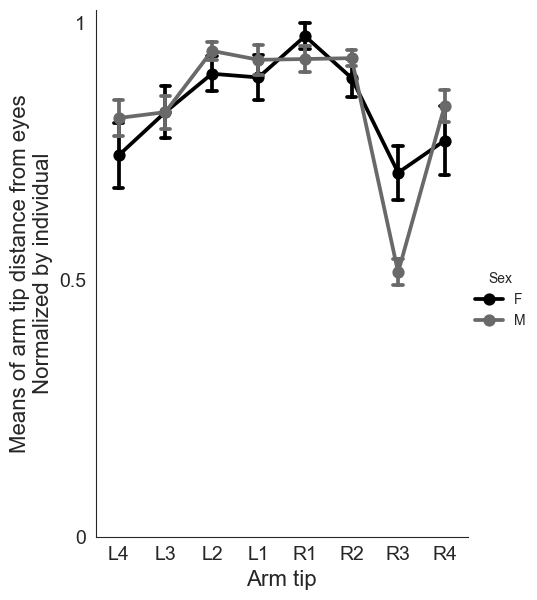

In [34]:
sns.set_style("white")
g = sns.catplot(data=df, 
                x='Body part', 
                y='Norm_distance_mean', 
                hue="Sex", 
                capsize=.2, 
                palette=['black', 'dimgray'], 
                hue_order=['F', 'M'],
                errorbar="se",
                kind="point", 
                height=6, aspect=.75)
ax = g.ax
fig = g.fig
ax.set_aspect('auto')
ax.set_ylabel('Means of arm tip distance from eyes\nNormalized by individual', fontsize=16)
ax.set_xlabel('Arm tip', fontsize=16)
ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7])
ax.set_xticklabels(['L4', 'L3', 'L2', 'L1', 'R1', 'R2', 'R3', 'R4'], fontsize=14)
ax.set_yticks([0, 0.5, 1])
ax.set_yticklabels([0,.5,1], fontsize=14)

figname = 'inferencedArmTips__meansNormalizedArmTipToEyes.png'
fig.savefig(os.path.join(target_dir, figname), dpi=300)

plt.show(fig)
plt.close(fig)

Running the same interaction as before but with the normalzied data

In [35]:
model = ols(r'Norm_distance_mean ~ C(Sex) + C(Arm_tip) + C(Sex):C(Arm_tip)', 
            data=df).fit()
round(sm.stats.anova_lm(model, typ=2),5)

,sum_sq,df,F,PR(>F)
C(Sex),0.00012,1.0,0.01668,0.89755
C(Arm_tip),1.22927,7.0,25.01702,0.00000
C(Sex):C(Arm_tip),0.14394,7.0,2.92929,0.00881
Residual,0.56157,80.0,NaN,NaN


Now the interaction between sex and arm tip is significant, but there is no effect of sex.

Lets see if the same thing happens with the un-normalized KDE data

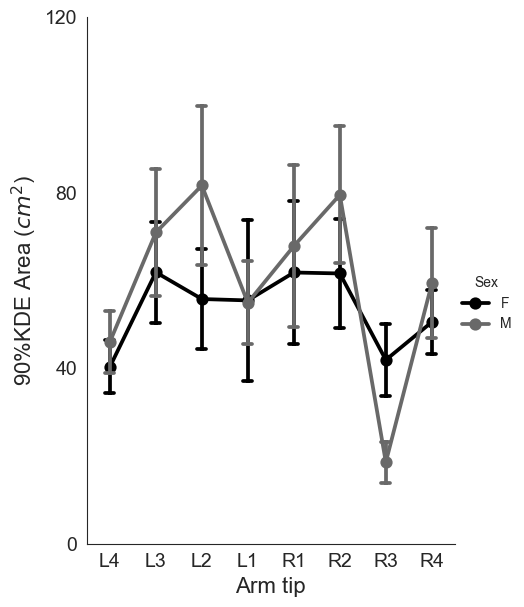

In [36]:
sns.set_style("white")
g = sns.catplot(data=df, 
                x='Body part', 
                y='KDE_Area_cm_2', 
                hue="Sex", 
                capsize=.2, 
                palette=['black', 'dimgray'], 
                hue_order=['F', 'M'],
                errorbar="se",
                kind="point", 
                height=6, aspect=.75)
ax = g.ax
fig = g.fig
ax.set_aspect('auto')
ax.set_ylabel('90%KDE Area ($cm^2$)', fontsize=16)
ax.set_xlabel('Arm tip', fontsize=16)
ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7])
ax.set_xticklabels(['L4', 'L3', 'L2', 'L1', 'R1', 'R2', 'R3', 'R4'], fontsize=14)
ax.set_yticks([0, 40, 80, 120])
ax.set_yticklabels([0, 40, 80, 120],fontsize=14)

figname = 'inferencedArmTips__kdeAreaArmTips.png'
fig.savefig(os.path.join(target_dir, figname), dpi=300)

plt.show(fig)
plt.close(fig)

In [37]:
model = ols(r'KDE_Area_cm_2 ~ C(Sex) + C(Arm_tip) + C(Sex):C(Arm_tip)', 
            data=df).fit()
round(sm.stats.anova_lm(model, typ=2),5)

,sum_sq,df,F,PR(>F)
C(Sex),817.07943,1.0,0.69174,0.40805
C(Arm_tip),21965.88343,7.0,2.65662,0.01598
C(Sex):C(Arm_tip),3876.27107,7.0,0.46881,0.85437
Residual,94495.44502,80.0,NaN,NaN


Similar trend, without normalization we only see the effect of arm tip

Now lets try out the same test but with the normalized KDE areas

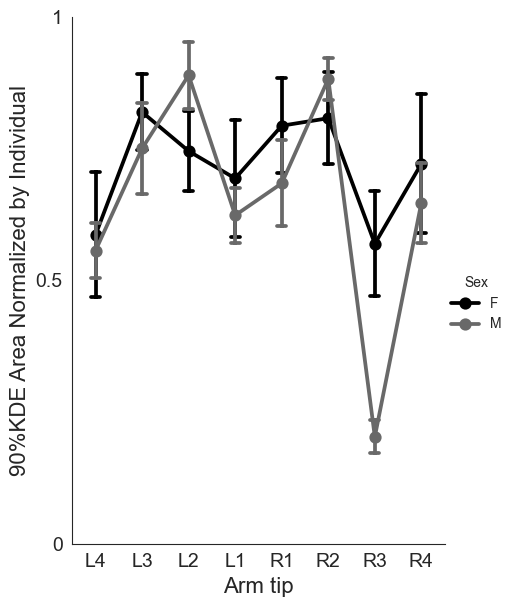

In [38]:
sns.set_style("white")
g = sns.catplot(data=df, 
                x='Body part', 
                y='Norm_KDE_Area', 
                hue="Sex", 
                capsize=.2, 
                palette=['black', 'dimgray'], 
                hue_order=['F', 'M'],
                errorbar="se",
                kind="point", 
                height=6, aspect=.75)
ax = g.ax
fig = g.fig
ax.set_aspect('auto')
ax.set_ylabel('90%KDE Area Normalized by Individual',fontsize=16)
ax.set_xlabel('Arm tip',fontsize=16)
ax.set_xticks([0, 1, 2, 3, 4, 5, 6, 7])
ax.set_xticklabels(['L4', 'L3', 'L2', 'L1', 'R1', 'R2', 'R3', 'R4'],fontsize=14)
ax.set_yticks([0, .5, 1])
ax.set_yticklabels([0, .5, 1],fontsize=14)

figname = 'inferencedArmTips__kdeNormalizedAreaArmTips.png'
fig.savefig(os.path.join(target_dir, figname), dpi=300)

plt.show(fig)
plt.close(fig)

In [39]:
model = ols(r'Norm_KDE_Area ~ C(Sex) + C(Arm_tip) + C(Sex):C(Arm_tip)', 
            data=df).fit()
round(sm.stats.anova_lm(model, typ=2),5)

,sum_sq,df,F,PR(>F)
C(Sex),0.08333,1.0,2.41966,0.12377
C(Arm_tip),2.49295,7.0,10.34113,0.00000
C(Sex):C(Arm_tip),0.41947,7.0,1.74002,0.11143
Residual,2.75510,80.0,NaN,NaN


Still only an effect of arm tip, while the significance of the sex and interaction between sex and arm tip became more significant.

Now we are just going to compare the differences in R3 between male and female octopus directly with an indenpendant measures ttest

In [40]:
dat = df[df['Body part'] == 'r3'] ## subsetting the dataframe

Ttest_indResult(statistic=3.7822548485506315, pvalue=0.003588663221958824)
Ttest_indResult(statistic=4.53658361982179, pvalue=0.0010803751304558145)


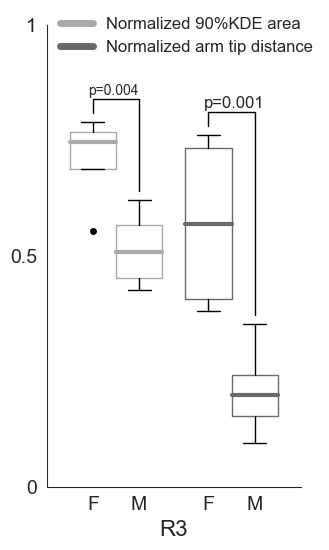

In [41]:
fig, (ax1) = plt.subplots(1,1,figsize=(8,6))

col_kde = 'darkgrey'
col_dst = 'dimgrey'
flierprops = dict(marker='.', markerfacecolor='black', markersize=10,
                  markeredgecolor='none')

txtpad = .01
pvpad = .02
pvlim = .05
wds = .1
ax=ax1
F_ND = np.array(dat[dat['Sex'] == 'F']['Norm_distance_mean'].tolist()).astype('float')
M_ND = np.array(dat[dat['Sex'] == 'M']['Norm_distance_mean'].tolist()).astype('float')
ND_out = stats.ttest_ind(F_ND, M_ND)
print(ND_out)
medianprops = dict(linestyle='-', linewidth=3, color=col_kde)
boxprops = dict(linestyle='-', linewidth=1, color=col_kde)
ax.boxplot(np.array([F_ND, M_ND], dtype='object'), 
           positions=[0,0+wds], 
           widths=[wds,wds],
           flierprops=flierprops,
           medianprops=medianprops,
           boxprops=boxprops)
px = [0, 0, 0+wds, 0+wds]
py = [max(F_ND)+pvpad, max(F_ND)+pvlim, max(F_ND)+pvlim, max(M_ND)+pvpad]
ax.plot(px, py, color='black', linewidth=1)
p = round(ND_out.pvalue,3)
ax.text(px[0]-txtpad,py[1]+txtpad, f'p={p}')

F_NA = np.array(dat[dat['Sex'] == 'F']['Norm_KDE_Area'].tolist()).astype('float')
M_NA = np.array(dat[dat['Sex'] == 'M']['Norm_KDE_Area'].tolist()).astype('float')
NA_out = stats.ttest_ind(F_NA, M_NA)
print(NA_out)
medianprops = dict(linestyle='-', linewidth=3, color=col_dst)
boxprops = dict(linestyle='-', linewidth=1, color=col_dst)

ax.boxplot(np.array([F_NA, M_NA], dtype='object'), 
           positions=[0+2.5*wds,0+3.5*wds],  
           widths=[wds,wds],
           flierprops=flierprops,
           medianprops=medianprops,
           boxprops=boxprops)
px = [0+2.5*wds, 0+2.5*wds, 0+3.5*wds, 0+3.5*wds]
py = [max(F_NA)+pvpad, max(F_NA)+pvlim, max(F_NA)+pvlim, max(M_NA)+pvpad]
ax.plot(px, py, color='black', linewidth=1)
p = round(NA_out.pvalue,3)
ax.text(px[0]-txtpad,py[1]+txtpad, f'p={p}',fontsize=12)

xticks = [0,0+wds,0+2.5*wds,0+3.5*wds]
xlabs = ['F','M','F','M']
ax.set_xticks(xticks)
ax.set_xticklabels(xlabs, 
                   rotation=0,
                  fontsize=14)
ax.set_xlim(xticks[0]-wds, xticks[-1]+wds)
ax.set_yticks([0, .5, 1])
ax.set_yticklabels([0,.5,1], fontsize=14)
ax.set_aspect(1)

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

legend_lines = [Line2D([0], [0], color=col_kde, lw=5),
                Line2D([0], [0], color=col_dst, lw=5)]
legend_labels = [f'Normalized 90%KDE area',
                 f'Normalized arm tip distance']
ax.legend(legend_lines, legend_labels, loc="upper center", bbox_to_anchor = (.55,1.05),
           frameon=False, fontsize=12,)

ax.set_xlabel('R3',fontsize=16)

fig_name = 'male-to-female-comparison.png'
path_fig = os.path.join(target_dir, fig_name)
fig.savefig(path_fig, dpi=300)

plt.show(fig)
plt.close(fig)

In [42]:
print(f'KDE: t({len(F_NA)-1},{len(M_NA)-1}) = T({round(NA_out.statistic,3)}); p = {round(NA_out.pvalue,3)}')
print(f'Dist: t({len(F_ND)-1},{len(M_ND)-1}) = T({round(ND_out.statistic,3)}); p = {round(ND_out.pvalue,3)}')

KDE: t(3,7) = T(4.537); p = 0.001
Dist: t(3,7) = T(3.782); p = 0.004


So here we can see that indeed, the male octopuses are holding their arms closer to their body than the females

Now lets compare R3 to the rest of the arm tips

R3 Female Distance Comparison: t(3,27) = T(-2.45581); p = 0.02007
R3 Male Distance Comparison: t(7,55) = T(-11.04705); p = 3e-16
R3 Female KDE Comparison: t(3,27) = T(-1.62884); p = 0.1138
R3 Male KDE Comparison: t(7,55) = T(-6.70026); p = 7.0810741e-09


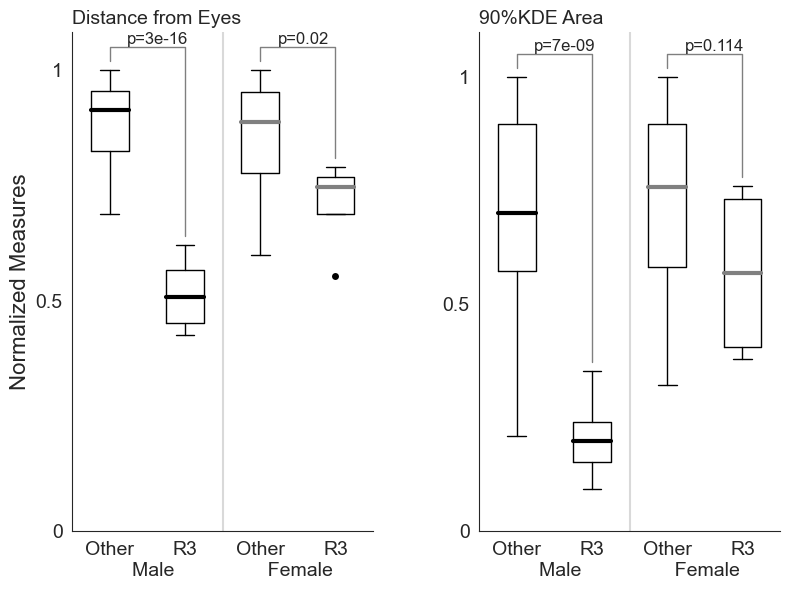

In [43]:
dat_r3 = df[df['Arm_tip'] == 'r3']
dat_else = df[df['Arm_tip'] != 'r3']

fig, (ax1, ax2) = plt.subplots(1,2,figsize=(8,6))

## Dist ##
r3_f = np.array(dat_r3[dat_r3['Sex'] == 'F']['Norm_distance_mean'].tolist())
r3_else_f = np.array(dat_else[dat_else['Sex'] == 'F']['Norm_distance_mean'].tolist())
r3_f_comp = stats.ttest_ind(r3_f, r3_else_f)

r3_m = np.array(dat_r3[dat_r3['Sex'] == 'M']['Norm_distance_mean'].tolist())
r3_else_m = np.array(dat_else[dat_else['Sex'] == 'M']['Norm_distance_mean'].tolist())
r3_m_comp = stats.ttest_ind(r3_m, r3_else_m)

ax=ax1
medianprops = dict(linestyle='-', linewidth=3, color='black')
boxprops = dict(linestyle='-', linewidth=1, color='black')
ax.boxplot(r3_m, positions=[1], widths=[.5], medianprops=medianprops)
ax.boxplot(r3_else_m, positions=[0], widths=[.5], medianprops=medianprops)
#ax.text(.3,0.01,'Male', fontsize=14)

py = [max(r3_else_m)+.02, max(r3_else_m)+.05, max(r3_else_m)+.05, max(r3_m)+.02]
px = [0, 0, 1, 1]
ax.plot(px, py, color='black', linewidth=1, alpha=0.5)
ax.text(0.23, max(r3_else_m)+.056, f'p={round(r3_m_comp.pvalue,16)}', fontsize=12)

flierprops = dict(marker='.', markerfacecolor='black', markersize=10,
                  markeredgecolor='none')
medianprops = dict(linestyle='-', linewidth=3, color='grey')
boxprops = dict(linestyle='-', linewidth=1, color='grey')
ax.boxplot(r3_f, positions=[3], widths=[.5], medianprops=medianprops,flierprops=flierprops)
ax.boxplot(r3_else_f, positions=[2], widths=[.5], medianprops=medianprops)

py = [max(r3_else_f)+.02, max(r3_else_f)+.05, max(r3_else_f)+.05, max(r3_f)+.02]
px = [2, 2, 3, 3]
ax.plot(px, py, color='black', linewidth=1, alpha=0.5)
ax.text(2.23, max(r3_else_f)+.056, f'p={round(r3_f_comp.pvalue,3)}', fontsize=12)

ax.set_xticks([0,1,2,3])
ax.set_xticklabels(['Other\n                Male', 'R3', 
                    'Other\n               Female', 'R3'], fontsize=14)
ax.axvline(x=1.5, color='black', alpha=0.15)

ax.set_yticks([0,.5,1])
ax.set_yticklabels([0,.5,1],fontsize=14)

ax.set_ylabel('Normalized Measures',fontsize=16)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_title('Distance from Eyes', loc='left', fontsize=14)

print(f'R3 Female Distance Comparison: t({len(r3_f)-1},{len(r3_else_f)-1}) = T({round(r3_f_comp.statistic,5)}); p = {round(r3_f_comp.pvalue,5)}')
print(f'R3 Male Distance Comparison: t({len(r3_m)-1},{len(r3_else_m)-1}) = T({round(r3_m_comp.statistic,5)}); p = {round(r3_m_comp.pvalue,16)}')

## KDE ##
r3_f = np.array(dat_r3[dat_r3['Sex'] == 'F']['Norm_KDE_Area'].tolist())
r3_else_f = np.array(dat_else[dat_else['Sex'] == 'F']['Norm_KDE_Area'].tolist())
r3_f_comp = stats.ttest_ind(r3_f, r3_else_f)

r3_m = np.array(dat_r3[dat_r3['Sex'] == 'M']['Norm_KDE_Area'].tolist())
r3_else_m = np.array(dat_else[dat_else['Sex'] == 'M']['Norm_KDE_Area'].tolist())
r3_m_comp = stats.ttest_ind(r3_m, r3_else_m)

ax=ax2
medianprops = dict(linestyle='-', linewidth=3, color='black')
boxprops = dict(linestyle='-', linewidth=1, color='black')
ax.boxplot(r3_m, positions=[1], widths=[.5], medianprops=medianprops)
ax.boxplot(r3_else_m, positions=[0], widths=[.5], medianprops=medianprops)
#ax.text(.3,0.01,'Male', fontsize=14)

py = [max(r3_else_m)+.02, max(r3_else_m)+.05, max(r3_else_m)+.05, max(r3_m)+.02]
px = [0, 0, 1, 1]
ax.plot(px, py, color='black', linewidth=1, alpha=0.5)
ax.text(0.23, max(r3_else_m)+.056, f'p={round(r3_m_comp.pvalue,9)}', fontsize=12)

flierprops = dict(marker='.', markerfacecolor='black', markersize=10,
                  markeredgecolor='none')
medianprops = dict(linestyle='-', linewidth=3, color='grey')
boxprops = dict(linestyle='-', linewidth=1, color='grey')
ax.boxplot(r3_f, positions=[3], widths=[.5], medianprops=medianprops,flierprops=flierprops)
ax.boxplot(r3_else_f, positions=[2], widths=[.5], medianprops=medianprops)

py = [max(r3_else_f)+.02, max(r3_else_f)+.05, max(r3_else_f)+.05, max(r3_f)+.02]
px = [2, 2, 3, 3]
ax.plot(px, py, color='black', linewidth=1, alpha=0.5)
ax.text(2.23, max(r3_else_f)+.056, f'p={round(r3_f_comp.pvalue,3)}', fontsize=12)

ax.set_xticks([0,1,2,3])
ax.set_xticklabels(['Other\n                Male', 'R3', 
                    'Other\n               Female', 'R3'], fontsize=14)
ax.axvline(x=1.5, color='black', alpha=0.15)

ax.set_yticks([0,.5,1])
ax.set_yticklabels([0,.5,1],fontsize=14)

#ax.set_ylabel('Normalized 90%KDE Area',fontsize=16)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_title('90%KDE Area', loc='left', fontsize=14)

print(f'R3 Female KDE Comparison: t({len(r3_f)-1},{len(r3_else_f)-1}) = T({round(r3_f_comp.statistic,5)}); p = {round(r3_f_comp.pvalue,5)}')
print(f'R3 Male KDE Comparison: t({len(r3_m)-1},{len(r3_else_m)-1}) = T({round(r3_m_comp.statistic,5)}); p = {round(r3_m_comp.pvalue,16)}')

fig.tight_layout(w_pad=5)

fig_name = 'male-to-male_female-to-female.png'
path_fig = os.path.join(target_dir, fig_name)
fig.savefig(path_fig, dpi=300)

plt.show(fig)
plt.close(fig)

This is an interesting result. My expectation is that there would be no difference for female octopus arm distance or area. This expectation is just barely met for the area and it is smashed for the distance. But really, it is not so surprising that R3 is different from the rest for both. Octopus rear arms (L3, L4, R4, R3) are used differently than the front arms (L2, L1, R1, R2). So lets see if instead we split on front and rear. Expectation is that comparing R3 to other rear arms will remove the significance

R3 Female Distance Comparison: t(3,11) = T(-1.09136); p = 0.29354
R3 Male Distance Comparison: t(7,23) = T(-8.94906); p = 5.685271e-10
R3 Female KDE Comparison: t(3,11) = T(-1.10557); p = 0.28755
R3 Male KDE Comparison: t(7,23) = T(-5.75482); p = 2.7718186625e-06


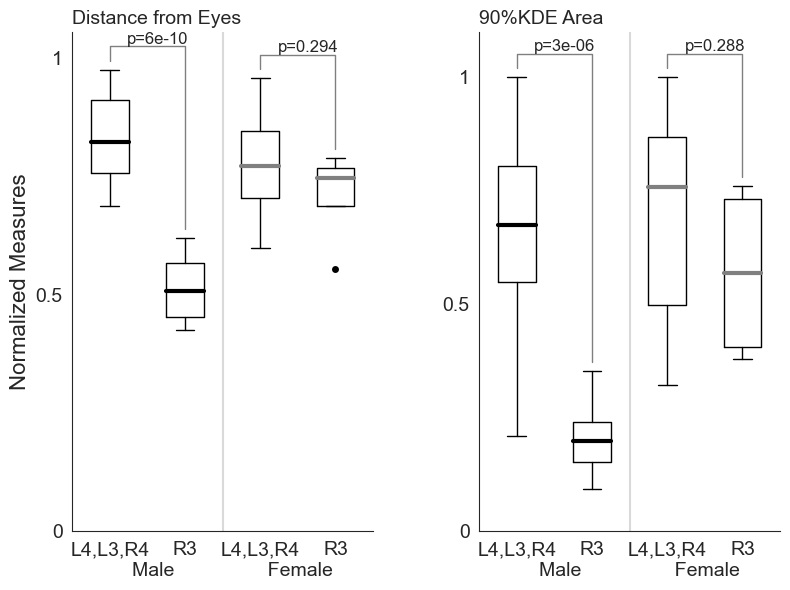

In [44]:
dat_r3 = df[df['Arm_tip'] == 'r3']
dat_else = df[(df['Arm_tip'] == 'l4') | (df['Arm_tip'] == 'l3') | (df['Arm_tip'] == 'r4')]

fig, (ax1, ax2) = plt.subplots(1,2,figsize=(8,6))

## Dist ##
r3_f = np.array(dat_r3[dat_r3['Sex'] == 'F']['Norm_distance_mean'].tolist())
r3_else_f = np.array(dat_else[dat_else['Sex'] == 'F']['Norm_distance_mean'].tolist())
r3_f_comp = stats.ttest_ind(r3_f, r3_else_f)

r3_m = np.array(dat_r3[dat_r3['Sex'] == 'M']['Norm_distance_mean'].tolist())
r3_else_m = np.array(dat_else[dat_else['Sex'] == 'M']['Norm_distance_mean'].tolist())
r3_m_comp = stats.ttest_ind(r3_m, r3_else_m)

ax=ax1
medianprops = dict(linestyle='-', linewidth=3, color='black')
boxprops = dict(linestyle='-', linewidth=1, color='black')
ax.boxplot(r3_m, positions=[1], widths=[.5], medianprops=medianprops)
ax.boxplot(r3_else_m, positions=[0], widths=[.5], medianprops=medianprops)
#ax.text(.3,0.01,'Male', fontsize=14)

py = [max(r3_else_m)+.02, max(r3_else_m)+.05, max(r3_else_m)+.05, max(r3_m)+.02]
px = [0, 0, 1, 1]
ax.plot(px, py, color='black', linewidth=1, alpha=0.5)
ax.text(0.23, max(r3_else_m)+.056, f'p={round(r3_m_comp.pvalue,10)}', fontsize=12)

flierprops = dict(marker='.', markerfacecolor='black', markersize=10,
                  markeredgecolor='none')
medianprops = dict(linestyle='-', linewidth=3, color='grey')
boxprops = dict(linestyle='-', linewidth=1, color='grey')
ax.boxplot(r3_f, positions=[3], widths=[.5], medianprops=medianprops,flierprops=flierprops)
ax.boxplot(r3_else_f, positions=[2], widths=[.5], medianprops=medianprops)

py = [max(r3_else_f)+.02, max(r3_else_f)+.05, max(r3_else_f)+.05, max(r3_f)+.02]
px = [2, 2, 3, 3]
ax.plot(px, py, color='black', linewidth=1, alpha=0.5)
ax.text(2.23, max(r3_else_f)+.056, f'p={round(r3_f_comp.pvalue,3)}', fontsize=12)

ax.set_xticks([0,1,2,3])
ax.set_xticklabels(['L4,L3,R4\n                Male', 'R3', 
                    'L4,L3,R4\n               Female', 'R3'], fontsize=14)
ax.axvline(x=1.5, color='black', alpha=0.15)

ax.set_yticks([0,.5,1])
ax.set_yticklabels([0,.5,1],fontsize=14)

ax.set_ylabel('Normalized Measures',fontsize=16)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_title('Distance from Eyes', loc='left', fontsize=14)

print(f'R3 Female Distance Comparison: t({len(r3_f)-1},{len(r3_else_f)-1}) = T({round(r3_f_comp.statistic,5)}); p = {round(r3_f_comp.pvalue,5)}')
print(f'R3 Male Distance Comparison: t({len(r3_m)-1},{len(r3_else_m)-1}) = T({round(r3_m_comp.statistic,5)}); p = {round(r3_m_comp.pvalue,16)}')

## KDE ##
r3_f = np.array(dat_r3[dat_r3['Sex'] == 'F']['Norm_KDE_Area'].tolist())
r3_else_f = np.array(dat_else[dat_else['Sex'] == 'F']['Norm_KDE_Area'].tolist())
r3_f_comp = stats.ttest_ind(r3_f, r3_else_f)

r3_m = np.array(dat_r3[dat_r3['Sex'] == 'M']['Norm_KDE_Area'].tolist())
r3_else_m = np.array(dat_else[dat_else['Sex'] == 'M']['Norm_KDE_Area'].tolist())
r3_m_comp = stats.ttest_ind(r3_m, r3_else_m)

ax=ax2
medianprops = dict(linestyle='-', linewidth=3, color='black')
boxprops = dict(linestyle='-', linewidth=1, color='black')
ax.boxplot(r3_m, positions=[1], widths=[.5], medianprops=medianprops)
ax.boxplot(r3_else_m, positions=[0], widths=[.5], medianprops=medianprops)
#ax.text(.3,0.01,'Male', fontsize=14)

py = [max(r3_else_m)+.02, max(r3_else_m)+.05, max(r3_else_m)+.05, max(r3_m)+.02]
px = [0, 0, 1, 1]
ax.plot(px, py, color='black', linewidth=1, alpha=0.5)
ax.text(0.23, max(r3_else_m)+.056, f'p={round(r3_m_comp.pvalue,6)}', fontsize=12)

flierprops = dict(marker='.', markerfacecolor='black', markersize=10,
                  markeredgecolor='none')
medianprops = dict(linestyle='-', linewidth=3, color='grey')
boxprops = dict(linestyle='-', linewidth=1, color='grey')
ax.boxplot(r3_f, positions=[3], widths=[.5], medianprops=medianprops,flierprops=flierprops)
ax.boxplot(r3_else_f, positions=[2], widths=[.5], medianprops=medianprops)

py = [max(r3_else_f)+.02, max(r3_else_f)+.05, max(r3_else_f)+.05, max(r3_f)+.02]
px = [2, 2, 3, 3]
ax.plot(px, py, color='black', linewidth=1, alpha=0.5)
ax.text(2.23, max(r3_else_f)+.056, f'p={round(r3_f_comp.pvalue,3)}', fontsize=12)

ax.set_xticks([0,1,2,3])
ax.set_xticklabels(['L4,L3,R4\n                Male', 'R3', 
                    'L4,L3,R4\n               Female', 'R3'], fontsize=14)
ax.axvline(x=1.5, color='black', alpha=0.15)

ax.set_yticks([0,.5,1])
ax.set_yticklabels([0,.5,1],fontsize=14)

#ax.set_ylabel('Normalized 90%KDE Area',fontsize=16)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_title('90%KDE Area', loc='left', fontsize=14)

print(f'R3 Female KDE Comparison: t({len(r3_f)-1},{len(r3_else_f)-1}) = T({round(r3_f_comp.statistic,5)}); p = {round(r3_f_comp.pvalue,5)}')
print(f'R3 Male KDE Comparison: t({len(r3_m)-1},{len(r3_else_m)-1}) = T({round(r3_m_comp.statistic,5)}); p = {round(r3_m_comp.pvalue,16)}')

fig.tight_layout(w_pad=5)

fig_name = 'male-to-male_female-to-female.png'
path_fig = os.path.join(target_dir, fig_name)
fig.savefig(path_fig, dpi=300)

plt.show(fig)
plt.close(fig)

Expectation is that if instead we compared to the front arms (L3, L1, R1, R2) we will see a large difference.

R3 Female Distance Comparison: t(3,15) = T(-4.66475); p = 0.00019
R3 Male Distance Comparison: t(7,31) = T(-16.56808); p = 0.0
R3 Female KDE Comparison: t(3,15) = T(-1.9342); p = 0.06897
R3 Male KDE Comparison: t(7,31) = T(-7.62639); p = 3.5512223e-09


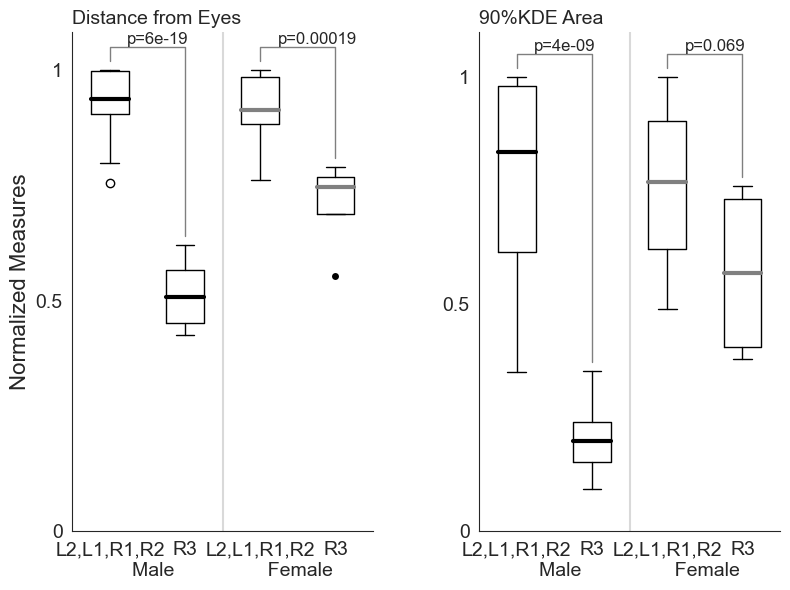

In [45]:
dat_r3 = df[df['Arm_tip'] == 'r3']
dat_else = df[(df['Arm_tip'] == 'l2') | (df['Arm_tip'] == 'l1') | (df['Arm_tip'] == 'r1') | (df['Arm_tip'] == 'r2')]

fig, (ax1, ax2) = plt.subplots(1,2,figsize=(8,6))

## Dist ##
r3_f = np.array(dat_r3[dat_r3['Sex'] == 'F']['Norm_distance_mean'].tolist())
r3_else_f = np.array(dat_else[dat_else['Sex'] == 'F']['Norm_distance_mean'].tolist())
r3_f_comp = stats.ttest_ind(r3_f, r3_else_f)

r3_m = np.array(dat_r3[dat_r3['Sex'] == 'M']['Norm_distance_mean'].tolist())
r3_else_m = np.array(dat_else[dat_else['Sex'] == 'M']['Norm_distance_mean'].tolist())
r3_m_comp = stats.ttest_ind(r3_m, r3_else_m)

ax=ax1
medianprops = dict(linestyle='-', linewidth=3, color='black')
boxprops = dict(linestyle='-', linewidth=1, color='black')
ax.boxplot(r3_m, positions=[1], widths=[.5], medianprops=medianprops)
ax.boxplot(r3_else_m, positions=[0], widths=[.5], medianprops=medianprops)
#ax.text(.3,0.01,'Male', fontsize=14)

py = [max(r3_else_m)+.02, max(r3_else_m)+.05, max(r3_else_m)+.05, max(r3_m)+.02]
px = [0, 0, 1, 1]
ax.plot(px, py, color='black', linewidth=1, alpha=0.5)
ax.text(0.23, max(r3_else_m)+.056, f'p={round(r3_m_comp.pvalue,19)}', fontsize=12)

flierprops = dict(marker='.', markerfacecolor='black', markersize=10,
                  markeredgecolor='none')
medianprops = dict(linestyle='-', linewidth=3, color='grey')
boxprops = dict(linestyle='-', linewidth=1, color='grey')
ax.boxplot(r3_f, positions=[3], widths=[.5], medianprops=medianprops,flierprops=flierprops)
ax.boxplot(r3_else_f, positions=[2], widths=[.5], medianprops=medianprops)

py = [max(r3_else_f)+.02, max(r3_else_f)+.05, max(r3_else_f)+.05, max(r3_f)+.02]
px = [2, 2, 3, 3]
ax.plot(px, py, color='black', linewidth=1, alpha=0.5)
ax.text(2.23, max(r3_else_f)+.056, f'p={round(r3_f_comp.pvalue,5)}', fontsize=12)

ax.set_xticks([0,1,2,3])
ax.set_xticklabels(['L2,L1,R1,R2\n                Male', 'R3', 
                    'L2,L1,R1,R2\n               Female', 'R3'], fontsize=14)
ax.axvline(x=1.5, color='black', alpha=0.15)

ax.set_yticks([0,.5,1])
ax.set_yticklabels([0,.5,1],fontsize=14)

ax.set_ylabel('Normalized Measures',fontsize=16)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_title('Distance from Eyes', loc='left', fontsize=14)

print(f'R3 Female Distance Comparison: t({len(r3_f)-1},{len(r3_else_f)-1}) = T({round(r3_f_comp.statistic,5)}); p = {round(r3_f_comp.pvalue,5)}')
print(f'R3 Male Distance Comparison: t({len(r3_m)-1},{len(r3_else_m)-1}) = T({round(r3_m_comp.statistic,5)}); p = {round(r3_m_comp.pvalue,16)}')

## KDE ##
r3_f = np.array(dat_r3[dat_r3['Sex'] == 'F']['Norm_KDE_Area'].tolist())
r3_else_f = np.array(dat_else[dat_else['Sex'] == 'F']['Norm_KDE_Area'].tolist())
r3_f_comp = stats.ttest_ind(r3_f, r3_else_f)

r3_m = np.array(dat_r3[dat_r3['Sex'] == 'M']['Norm_KDE_Area'].tolist())
r3_else_m = np.array(dat_else[dat_else['Sex'] == 'M']['Norm_KDE_Area'].tolist())
r3_m_comp = stats.ttest_ind(r3_m, r3_else_m)

ax=ax2
medianprops = dict(linestyle='-', linewidth=3, color='black')
boxprops = dict(linestyle='-', linewidth=1, color='black')
ax.boxplot(r3_m, positions=[1], widths=[.5], medianprops=medianprops)
ax.boxplot(r3_else_m, positions=[0], widths=[.5], medianprops=medianprops)
#ax.text(.3,0.01,'Male', fontsize=14)

py = [max(r3_else_m)+.02, max(r3_else_m)+.05, max(r3_else_m)+.05, max(r3_m)+.02]
px = [0, 0, 1, 1]
ax.plot(px, py, color='black', linewidth=1, alpha=0.5)
ax.text(0.23, max(r3_else_m)+.056, f'p={round(r3_m_comp.pvalue,9)}', fontsize=12)

flierprops = dict(marker='.', markerfacecolor='black', markersize=10,
                  markeredgecolor='none')
medianprops = dict(linestyle='-', linewidth=3, color='grey')
boxprops = dict(linestyle='-', linewidth=1, color='grey')
ax.boxplot(r3_f, positions=[3], widths=[.5], medianprops=medianprops,flierprops=flierprops)
ax.boxplot(r3_else_f, positions=[2], widths=[.5], medianprops=medianprops)

py = [max(r3_else_f)+.02, max(r3_else_f)+.05, max(r3_else_f)+.05, max(r3_f)+.02]
px = [2, 2, 3, 3]
ax.plot(px, py, color='black', linewidth=1, alpha=0.5)
ax.text(2.23, max(r3_else_f)+.056, f'p={round(r3_f_comp.pvalue,3)}', fontsize=12)

ax.set_xticks([0,1,2,3])
ax.set_xticklabels(['L2,L1,R1,R2\n                Male', 'R3', 
                    'L2,L1,R1,R2\n               Female', 'R3'], fontsize=14)
ax.axvline(x=1.5, color='black', alpha=0.15)

ax.set_yticks([0,.5,1])
ax.set_yticklabels([0,.5,1],fontsize=14)

#ax.set_ylabel('Normalized 90%KDE Area',fontsize=16)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

ax.set_title('90%KDE Area', loc='left', fontsize=14)

print(f'R3 Female KDE Comparison: t({len(r3_f)-1},{len(r3_else_f)-1}) = T({round(r3_f_comp.statistic,5)}); p = {round(r3_f_comp.pvalue,5)}')
print(f'R3 Male KDE Comparison: t({len(r3_m)-1},{len(r3_else_m)-1}) = T({round(r3_m_comp.statistic,5)}); p = {round(r3_m_comp.pvalue,16)}')

fig.tight_layout(w_pad=5)

fig_name = 'male-to-male_female-to-female.png'
path_fig = os.path.join(target_dir, fig_name)
fig.savefig(path_fig, dpi=300)

plt.show(fig)
plt.close(fig)

Comparing Normalized Means of Arm-tip Distance from the Eyes
	Female, Front to Back: t(15,11) = T(3.7973); p = 0.00079
	Female, R3 to Front: t(3,11) = T(-4.66475); p = 0.00019
	Female, R3 to Back: t(3,15) = T(-1.09136); p = 0.294
	Male, Front to Back: t(31,23) = T(5.31214); p = 2e-06
	Male, R3 to Front: t(7,23) = T(-16.56808); p = 6e-19
	Male, R3 to Back: t(7,31) = T(-8.94906); p = 6e-10

Comparing Normalized Arm-tip 90%KDE Areas
	Female, Front to Back: t(15,11) = T(0.68372); p = 0.5002
	Female, R3 to Front: t(3,11) = T(-1.9342); p = 0.06897
	Female, R3 to Back: t(3,15) = T(-1.10557); p = 0.288
	Male, Front to Back: t(31,23) = T(2.11094); p = 0.039
	Male, R3 to Front: t(7,23) = T(-7.62639); p = 4e-09
	Male, R3 to Back: t(7,31) = T(-5.75482); p = 3e-06


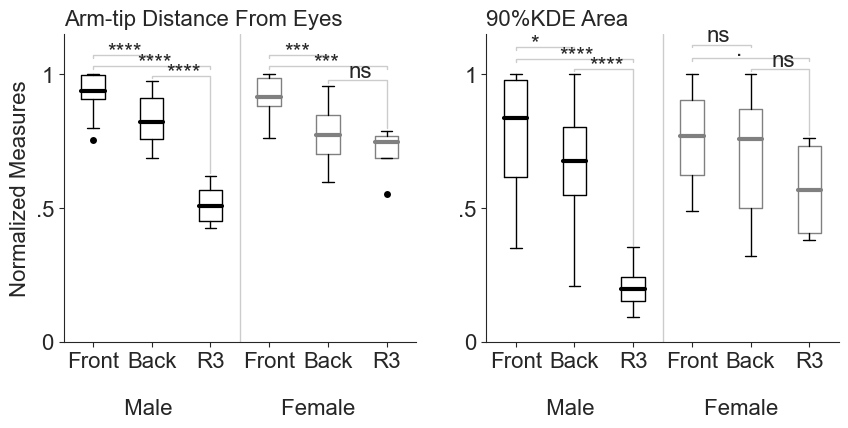

In [46]:
def get_p_symbol(p, alpha=0.05):
    if p > 0.1:
        return 'ns'
    elif p > 0.05:
        return '.'
    elif p > 0.01:
        return '*'
    elif p > 0.001:
        return '**'
    elif p > 0.0001:
        return '***'
    else:
        return '****'

fig, (ax1, ax2) = plt.subplots(1,2,figsize=(10,4))

dat_r3 = df[df['Arm_tip'] == 'r3']
dat_front = df[(df['Arm_tip'] == 'l2') | (df['Arm_tip'] == 'l1') | (df['Arm_tip'] == 'r1') | (df['Arm_tip'] == 'r2')]
dat_back = df[(df['Arm_tip'] == 'l4') | (df['Arm_tip'] == 'l3') | (df['Arm_tip'] == 'r4')]

print('Comparing Normalized Means of Arm-tip Distance from the Eyes')

## Dist ##
# Female #
r3_f = np.array(dat_r3[dat_r3['Sex'] == 'F']['Norm_distance_mean'].tolist())
r3_front_f = np.array(dat_front[dat_front['Sex'] == 'F']['Norm_distance_mean'].tolist())
r3_back_f = np.array(dat_back[dat_back['Sex'] == 'F']['Norm_distance_mean'].tolist())
f_r3_to_back = stats.ttest_ind(r3_f, r3_back_f)
f_r3_to_front = stats.ttest_ind(r3_f, r3_front_f)
f_front_to_back = stats.ttest_ind(r3_front_f, r3_back_f)

print(f'\tFemale, Front to Back: t({len(r3_front_f)-1},{len(r3_back_f)-1}) = T({round(f_front_to_back.statistic,5)}); p = {round(f_front_to_back.pvalue,5)}')
print(f'\tFemale, R3 to Front: t({len(r3_f)-1},{len(r3_back_f)-1}) = T({round(f_r3_to_front.statistic,5)}); p = {round(f_r3_to_front.pvalue,5)}')
print(f'\tFemale, R3 to Back: t({len(r3_f)-1},{len(r3_front_f)-1}) = T({round(f_r3_to_back .statistic,5)}); p = {round(f_r3_to_back .pvalue,3)}')

# Male #
r3_m = np.array(dat_r3[dat_r3['Sex'] == 'M']['Norm_distance_mean'].tolist())
r3_front_m = np.array(dat_front[dat_front['Sex'] == 'M']['Norm_distance_mean'].tolist())
r3_back_m = np.array(dat_back[dat_back['Sex'] == 'M']['Norm_distance_mean'].tolist())
m_r3_to_back = stats.ttest_ind(r3_m, r3_back_m)
m_r3_to_front = stats.ttest_ind(r3_m, r3_front_m)
m_front_to_back = stats.ttest_ind(r3_front_m, r3_back_m)

print(f'\tMale, Front to Back: t({len(r3_front_m)-1},{len(r3_back_m)-1}) = T({round(m_front_to_back.statistic,5)}); p = {round(m_front_to_back.pvalue,6)}')
print(f'\tMale, R3 to Front: t({len(r3_m)-1},{len(r3_back_m)-1}) = T({round(m_r3_to_front.statistic,5)}); p = {round(m_r3_to_front.pvalue,19)}')
print(f'\tMale, R3 to Back: t({len(r3_m)-1},{len(r3_front_m)-1}) = T({round(m_r3_to_back .statistic,5)}); p = {round(m_r3_to_back .pvalue,10)}')

print()
print('Comparing Normalized Arm-tip 90%KDE Areas')

# plotting #
ax=ax1
# params #
pos = [0, 1, 2, 3, 4, 5]
wds = [.4]*6
xticks = pos
xlabs = ['Front\n\n                  Male', 'Back', 'R3', 'Front\n\n                Female', 'Back', 'R3']
yticks = [0, 0.5, 1]
ylabs = ['0', '.5', '1']
ax.tick_params(bottom=True, left=True)
# male #
flierprops = dict(marker='.', markerfacecolor='black', markersize=10,
                  markeredgecolor='none')
medianprops = dict(linestyle='-', linewidth=3, color='black')
boxprops = dict(linestyle='-', linewidth=1, color='black')
ax.boxplot([r3_front_m, r3_back_m, r3_m], positions = pos[:3], widths = wds[:3],
          flierprops=flierprops, medianprops=medianprops, boxprops=boxprops)
# Female #
flierprops = dict(marker='.', markerfacecolor='black', markersize=10,
                  markeredgecolor='none')
medianprops = dict(linestyle='-', linewidth=3, color='grey')
boxprops = dict(linestyle='-', linewidth=1, color='grey')
ax.boxplot([r3_front_f, r3_back_f, r3_f], positions = pos[3:], widths = wds[3:],
          flierprops=flierprops, medianprops=medianprops, boxprops=boxprops)
# plot settings #
ax.set_xticks(xticks)
ax.set_xticklabels(xlabs,fontsize=16)
ax.set_yticks(yticks)
ax.set_yticklabels(ylabs,fontsize=16)
ax.axvline(x=(pos[3]+pos[2])/2, color='black', linewidth=1, alpha=0.2)
ax.set_ylabel('Normalized Measures',fontsize=16)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_title('Arm-tip Distance From Eyes', loc='left', fontsize=16)
ax.set_ylim(0, 1.15)

# draw comparison lines #
# Male #
# front to back #
b = 0
h = .01
sh = .05
th = -.01
tb = -.25
xpos = [pos[b], pos[b], pos[b+1], pos[b+1]]
ypos = [max(r3_front_m)+h+sh, max(r3_front_m)+h+h+sh, max(r3_front_m)+h+h+sh, max(r3_front_m)+h+sh]
ax.plot(xpos, ypos, color='black', linewidth=1, alpha=0.2)
p = m_front_to_back.pvalue
ax.text((xpos[2]+xpos[1])/2+tb, ypos[1]+th, get_p_symbol(p), fontsize=16)
# back to r3 #
b = 1
h = .01
sh = 0
th = -.01
tb = -.25
xpos = [pos[b], pos[b], pos[b+1], pos[b+1]]
ypos = [max(r3_back_m)+h+sh, max(r3_back_m)+h+h+sh, max(r3_back_m)+h+h+sh, max(r3_m)+h+sh]
ax.plot(xpos, ypos, color='black', linewidth=1, alpha=0.2)
p = m_r3_to_back.pvalue
ax.text((xpos[2]+xpos[1])/2+tb, ypos[1]+th, get_p_symbol(p), fontsize=16)
# front to r3 #
b = 0
h = .01
sh = 0.01
th = -.01
tb = -.25
xpos = [pos[b], pos[b], pos[b+1+1], pos[b+1+1]]
ypos = [max(r3_front_m)+h+sh, max(r3_front_m)+h+h+sh, max(r3_front_m)+h+h+sh, max(r3_front_m)+h+sh]
ax.plot(xpos, ypos, color='black', linewidth=1, alpha=0.2)
p = m_r3_to_front.pvalue
ax.text((xpos[2]+xpos[1])/2+tb, ypos[1]+th, get_p_symbol(p), fontsize=16)

# Female #
# front to back #
b = 3
h = .01
sh = .05
th = -.01
tb = -.25
xpos = [pos[b], pos[b], pos[b+1], pos[b+1]]
ypos = [max(r3_front_f)+h+sh, max(r3_front_f)+h+h+sh, max(r3_front_f)+h+h+sh, max(r3_front_f)+h+sh]
ax.plot(xpos, ypos, color='black', linewidth=1, alpha=0.2)
p = f_front_to_back.pvalue
ax.text((xpos[2]+xpos[1])/2+tb, ypos[1]+th, get_p_symbol(p), fontsize=16)
# back to r3 #
b = 4
h = .01
sh = 0
th = .01
tb = -.15
xpos = [pos[b], pos[b], pos[b+1], pos[b+1]]
ypos = [max(r3_back_f)+h+sh, max(r3_back_f)+h+h+sh, max(r3_back_f)+h+h+sh, max(r3_f)+h+sh]
ax.plot(xpos, ypos, color='black', linewidth=1, alpha=0.2)
p = f_r3_to_back.pvalue
ax.text((xpos[2]+xpos[1])/2+tb, ypos[1]+th, get_p_symbol(p), fontsize=16)
# front to r3 #
b = 3
h = .01
sh = 0.01
th = -.01
tb = -.25
xpos = [pos[b], pos[b], pos[b+1+1], pos[b+1+1]]
ypos = [max(r3_front_f)+h+sh, max(r3_front_f)+h+h+sh, max(r3_front_f)+h+h+sh, max(r3_front_f)+h+sh]
ax.plot(xpos, ypos, color='black', linewidth=1, alpha=0.2)
p = f_r3_to_front.pvalue
ax.text((xpos[2]+xpos[1])/2+tb, ypos[1]+th, get_p_symbol(p), fontsize=16)

## KDE ##
# Female #
r3_f = np.array(dat_r3[dat_r3['Sex'] == 'F']['Norm_KDE_Area'].tolist())
r3_front_f = np.array(dat_front[dat_front['Sex'] == 'F']['Norm_KDE_Area'].tolist())
r3_back_f = np.array(dat_back[dat_back['Sex'] == 'F']['Norm_KDE_Area'].tolist())
f_r3_to_back = stats.ttest_ind(r3_f, r3_back_f)
f_r3_to_front = stats.ttest_ind(r3_f, r3_front_f)
f_front_to_back = stats.ttest_ind(r3_front_f, r3_back_f)

print(f'\tFemale, Front to Back: t({len(r3_front_f)-1},{len(r3_back_f)-1}) = T({round(f_front_to_back.statistic,5)}); p = {round(f_front_to_back.pvalue,5)}')
print(f'\tFemale, R3 to Front: t({len(r3_f)-1},{len(r3_back_f)-1}) = T({round(f_r3_to_front.statistic,5)}); p = {round(f_r3_to_front.pvalue,5)}')
print(f'\tFemale, R3 to Back: t({len(r3_f)-1},{len(r3_front_f)-1}) = T({round(f_r3_to_back .statistic,5)}); p = {round(f_r3_to_back .pvalue,3)}')

# Male #
r3_m = np.array(dat_r3[dat_r3['Sex'] == 'M']['Norm_KDE_Area'].tolist())
r3_front_m = np.array(dat_front[dat_front['Sex'] == 'M']['Norm_KDE_Area'].tolist())
r3_back_m = np.array(dat_back[dat_back['Sex'] == 'M']['Norm_KDE_Area'].tolist())
m_r3_to_back = stats.ttest_ind(r3_m, r3_back_m)
m_r3_to_front = stats.ttest_ind(r3_m, r3_front_m)
m_front_to_back = stats.ttest_ind(r3_front_m, r3_back_m)

print(f'\tMale, Front to Back: t({len(r3_front_m)-1},{len(r3_back_m)-1}) = T({round(m_front_to_back.statistic,5)}); p = {round(m_front_to_back.pvalue,3)}')
print(f'\tMale, R3 to Front: t({len(r3_m)-1},{len(r3_back_m)-1}) = T({round(m_r3_to_front.statistic,5)}); p = {round(m_r3_to_front.pvalue,9)}')
print(f'\tMale, R3 to Back: t({len(r3_m)-1},{len(r3_front_m)-1}) = T({round(m_r3_to_back .statistic,5)}); p = {round(m_r3_to_back .pvalue,6)}')

# plotting #
ax=ax2
# params #
pos = [0, 1, 2, 3, 4, 5]
wds = [.4]*6
xticks = pos
xlabs = ['Front\n\n                  Male', 'Back', 'R3', 'Front\n\n                Female', 'Back', 'R3']
yticks = [0, 0.5, 1]
ylabs = ['0', '.5', '1']
ax.tick_params(bottom=True, left=True)
# male #
flierprops = dict(marker='.', markerfacecolor='black', markersize=10,
                  markeredgecolor='none')
medianprops = dict(linestyle='-', linewidth=3, color='black')
boxprops = dict(linestyle='-', linewidth=1, color='black')
ax.boxplot([r3_front_m, r3_back_m, r3_m], positions = pos[:3], widths = wds[:3],
          flierprops=flierprops, medianprops=medianprops, boxprops=boxprops)
# Female #
flierprops = dict(marker='.', markerfacecolor='black', markersize=10,
                  markeredgecolor='none')
medianprops = dict(linestyle='-', linewidth=3, color='grey')
boxprops = dict(linestyle='-', linewidth=1, color='grey')
ax.boxplot([r3_front_f, r3_back_f, r3_f], positions = pos[3:], widths = wds[3:],
          flierprops=flierprops, medianprops=medianprops, boxprops=boxprops)
# plot settings #
ax.set_xticks(xticks)
ax.set_xticklabels(xlabs,fontsize=16)
ax.set_yticks(yticks)
ax.set_yticklabels(ylabs,fontsize=16)
ax.axvline(x=(pos[3]+pos[2])/2, color='black', linewidth=1, alpha=0.2)
#ax.set_ylabel('Normalized Measures',fontsize=16)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.set_title('90%KDE Area', loc='left', fontsize=16)
ax.set_ylim(0, 1.15)

# draw comparison lines #
# Male #
# front to back #
b = 0
h = .01
sh = .08
th = -.01
tb = -.25
xpos = [pos[b], pos[b], pos[b+1], pos[b+1]]
ypos = [max(r3_front_m)+h+sh, max(r3_front_m)+h+h+sh, max(r3_front_m)+h+h+sh, max(r3_front_m)+h+sh]
ax.plot(xpos, ypos, color='black', linewidth=1, alpha=0.2)
p = m_front_to_back.pvalue
ax.text((xpos[2]+xpos[1])/2+tb, ypos[1]+th, get_p_symbol(p), fontsize=16)
# back to r3 #
b = 1
h = .01
sh = 0.0
th = -.01
tb = -.25
xpos = [pos[b], pos[b], pos[b+1], pos[b+1]]
ypos = [max(r3_back_m)+h+sh, max(r3_back_m)+h+h+sh, max(r3_back_m)+h+h+sh, max(r3_m)+h+sh]
ax.plot(xpos, ypos, color='black', linewidth=1, alpha=0.2)
p = m_r3_to_back.pvalue
ax.text((xpos[2]+xpos[1])/2+tb, ypos[1]+th, get_p_symbol(p), fontsize=16)
# front to r3 #
b = 0
h = .01
sh = 0.035
th = -.01
tb = -.25
xpos = [pos[b], pos[b], pos[b+1+1], pos[b+1+1]]
ypos = [max(r3_front_m)+h+sh, max(r3_front_m)+h+h+sh, max(r3_front_m)+h+h+sh, max(r3_front_m)+h+sh]
ax.plot(xpos, ypos, color='black', linewidth=1, alpha=0.2)
p = m_r3_to_front.pvalue
ax.text((xpos[2]+xpos[1])/2+tb, ypos[1]+th, get_p_symbol(p), fontsize=16)

# Female #
# front to back #
b = 3
h = .01
sh = .09
th = .01
tb = -.25
xpos = [pos[b], pos[b], pos[b+1], pos[b+1]]
ypos = [max(r3_front_f)+h+sh, max(r3_front_f)+h+h+sh, max(r3_front_f)+h+h+sh, max(r3_front_f)+h+sh]
ax.plot(xpos, ypos, color='black', linewidth=1, alpha=0.2)
p = f_front_to_back.pvalue
ax.text((xpos[2]+xpos[1])/2+tb, ypos[1]+th, get_p_symbol(p), fontsize=16)
# back to r3 #
b = 4
h = .01
sh = 0
th = .01
tb = -.15
xpos = [pos[b], pos[b], pos[b+1], pos[b+1]]
ypos = [max(r3_back_f)+h+sh, max(r3_back_f)+h+h+sh, max(r3_back_f)+h+h+sh, max(r3_f)+h+sh]
ax.plot(xpos, ypos, color='black', linewidth=1, alpha=0.2)
p = f_r3_to_back.pvalue
ax.text((xpos[2]+xpos[1])/2+tb, ypos[1]+th, get_p_symbol(p), fontsize=16)
# front to r3 #
b = 3
h = .01
sh = 0.04
th = .01
tb = -.25
xpos = [pos[b], pos[b], pos[b+1+1], pos[b+1+1]]
ypos = [max(r3_front_f)+h+sh, max(r3_front_f)+h+h+sh, max(r3_front_f)+h+h+sh, max(r3_front_f)+h+sh]
ax.plot(xpos, ypos, color='black', linewidth=1, alpha=0.2)
p = f_r3_to_front.pvalue
ax.text((xpos[2]+xpos[1])/2+tb, ypos[1]+th, get_p_symbol(p), fontsize=16)

fig_name = 'full_male-to-female-comparison.png'
path_fig = os.path.join(target_dir, fig_name)
fig.savefig(path_fig, dpi=300)

plt.show(fig)
plt.close(fig)

The males are holding R3 closer to their body! I think, the observation of r3 being a little closer to the body in the females (but not significantly) is due to labelling bias learned by the DeepLabCut model, which was trained on males and females